In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
#import diffxpy.api as de
import time
from scipy import sparse

import sys  
sys.path.insert(0, '/storage/groups/ml01/workspace/karin.hrovatin/code/diabetes_analysis/')
from importlib import reload  
import helper
reload(helper)
import helper as h
#import neighbours 
#reload(neighbours )
#import neighbours as snn
import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr
#sc.settings.verbosity = 3
#from marker_genes_collection.access import load as mgc_load

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [2]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
#library(Seurat)

In [3]:
# Path for saving results - last shared folder by all datasets
shared_folder='/dss/dsshome1/lxc07/gobi009/data/P21000/'
#backup_folder='/storage/groups/ml01/projects/2020_pancreas_karin.hrovatin/data/pancreas/scRNA/P21002/rev7/'

Load data:

In [4]:
#Load data
#adata=pickle.load(  open( shared_folder+"data_normalised.pkl", "rb" ) )
#adata=h.open_h5ad(shared_folder+"data_normalised.h5ad",unique_id2=UID2)
adata=sc.read(shared_folder+"data_normalised.h5ad")

## Load gene IDs

In [5]:
# Use EID info from cellrange data
# Assumes that all samples have same features, thus performs this for single sample

# Read CellRanger feature info
features_f=pd.read_table(shared_folder + 'human_healthy_features.tsv',header=None)
features_f.columns=['EID','gene_symbol_adata','feature_type'][:features_f.shape[1]]
features_f.index=features_f['EID']

# map gene names from Cellranger to gene names used in adata
af=ann.AnnData(var=features_f)
af.var_names=features_f['gene_symbol_adata']
af.var_names_make_unique()
features_f['gene_symbol_adata']=af.var_names

# load features from adata
features_used=adata.var_names
# Keep only features in adata
features_f.index=features_f['gene_symbol_adata']
adata.var['EID']=features_f.loc[features_used,'EID']

## Visualisation

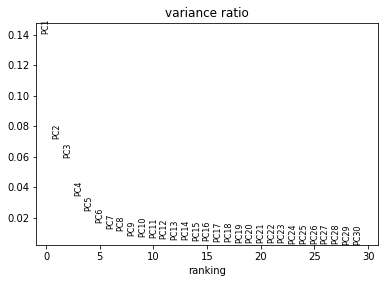

In [6]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [7]:
# Select number of PCs to use
N_PCS=7

Compare different embeddings based on previously defined annotation. 

In [8]:
#sc.pp.neighbors(adata,n_pcs = N_PCS,metric='correlation') 
#sc.tl.umap(adata)

In [9]:
#rcParams['figure.figsize']=(7,7)
#sc.pl.umap(adata,size=10,color=['pre_cell_type'])
#sc.pl.umap(adata,size=10,color=['file'])

In [10]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

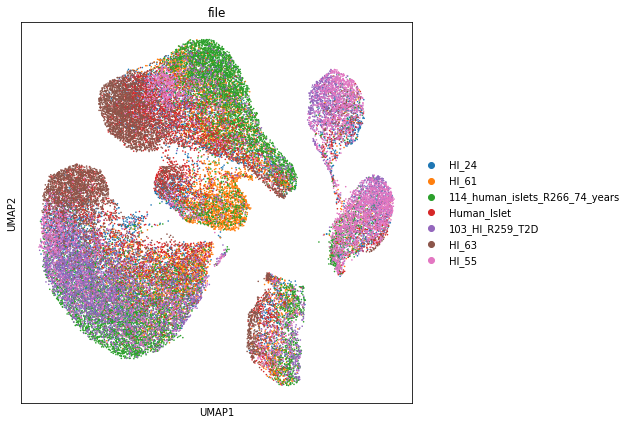

In [11]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata,size=10,color=['file'])

#### On scaled data

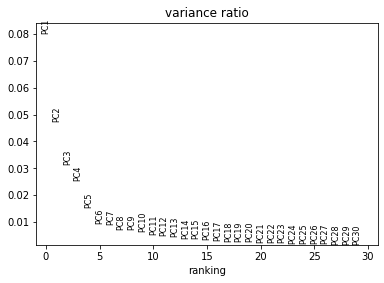

In [12]:
# Scale data and perform PCA
adata_scl=adata.copy()
sc.pp.scale(adata_scl,max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
rcParams['figure.figsize']=(6,4)
sc.pl.pca_variance_ratio(adata_scl)

In [13]:
#C: Can not stay the same as above
N_PCS

7

In [14]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = 9) 

In [15]:
# Umap on scaled data
sc.tl.umap(adata_scl)

In [16]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl']=adata_scl.obsm['X_umap']

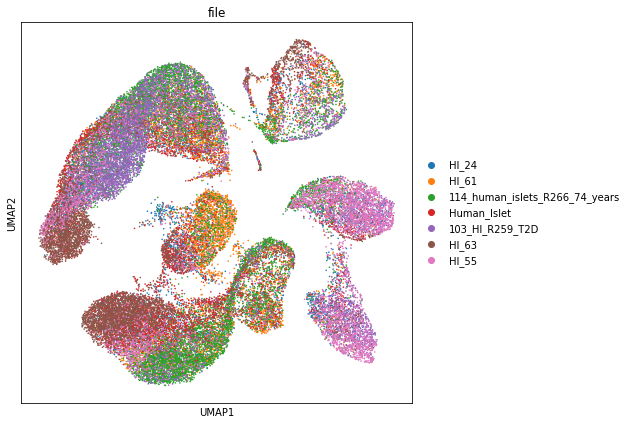

In [17]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata_scl,size=10,color=['file'])

## Cell cycle
Performed separately for individual batches.

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

MKI67 expression for comparison with cell cycle anno:

In [18]:
adata = sc.read(shared_folder+"after_cyclone.h5ad")
cyclone_anno = pd.read_pickle(shared_folder+'cyclone_anno.pkl')

In [19]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)
adata

AnnData object with n_obs × n_vars = 42346 × 16147
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors', 'phase_cyclone', 's_cyclone', 'g2m_cyclone', 'g1_cyclone'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'EID'
    uns: 'doublet_score_filter_colors', 'file_colors', 'hvg', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_umap_scl'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

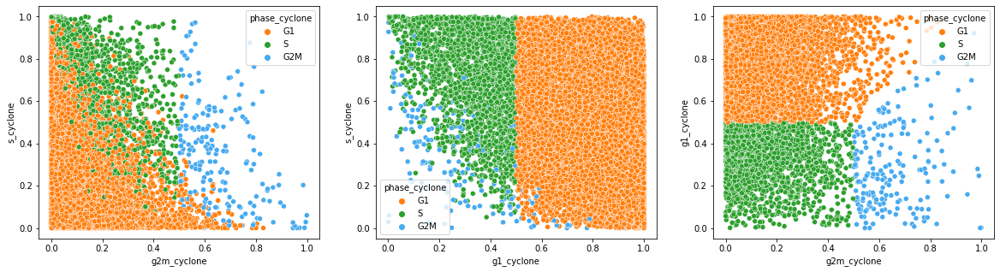

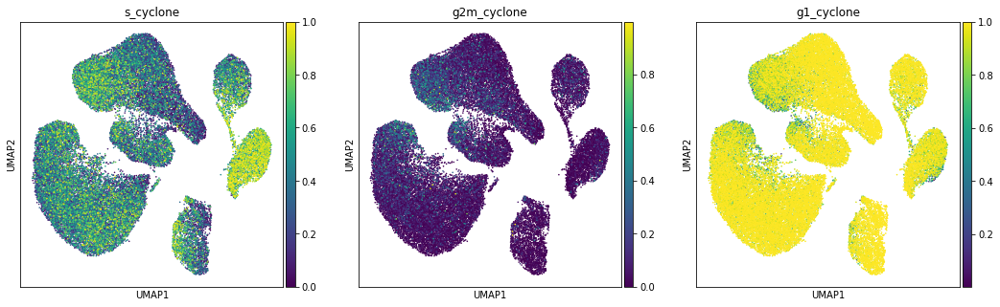

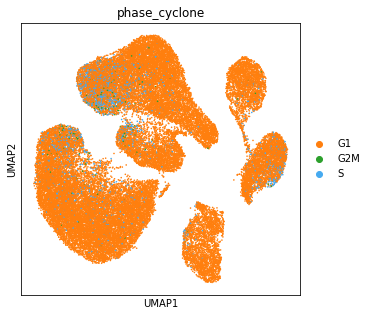

In [20]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize']=(20,5)
fig,axs=plt.subplots(1,3)
palette=sb.color_palette(['#ff7f0e', '#2ca02c','#46aaf0'])
sb.scatterplot(x='g2m_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[0],palette=palette)
sb.scatterplot(x='g1_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[1],palette=palette)
sb.scatterplot(x='g2m_cyclone',y='g1_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[2],palette=palette)
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone','g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors']=['#ff7f0e', '#2ca02c','#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=10, use_raw=False)

In [21]:
print('MKI67 in adata:',sum(adata.var.index=='MKI67'))
print('MKI67 in adata raw (only gene expression filtering):',sum(adata.raw.var.index=='MKI67'))
print('MKI67 in cellranger data:',features_f.query('gene_symbol_adata=="MKI67"').shape[0])

MKI67 in adata: 1
MKI67 in adata raw (only gene expression filtering): 1
MKI67 in cellranger data: 1


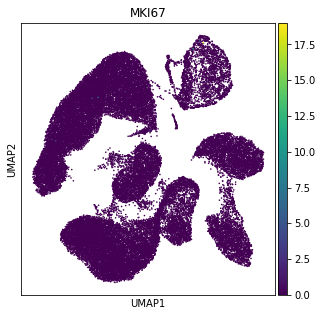

Amount of cells MKI67 is expressed in: 20


In [22]:
sc.pl.umap(adata_scl, color='MKI67' ,size=10, use_raw=True)
print('Amount of cells MKI67 is expressed in:', adata_scl.var.loc['MKI67']['n_cells'])

While MKI67 is present in the dataset, it is hardly expressed and therefore we can conclude that none of the cell popultations are proliferative.

## Save intermediate results before cell type annotation

In [23]:
#h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)
#adata.write(shared_folder+"data_annotated.h5ad")

# Cell type annotation

In [24]:
#adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)
#adata=sc.read(shared_folder+"data_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 42346 × 16147
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors', 'phase_cyclone', 's_cyclone', 'g2m_cyclone', 'g1_cyclone'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'EID'
    uns: 'doublet_score_filter_colors', 'file_colors', 'hvg', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors', 'neighbors', 'pca', 'umap', 'phase_cyclone_colors'
    obsm: 'X_pca', 'X_umap', 'X_umap_scl'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

## Endo high annotation

In [25]:
# Normalise raw data for cell type scoring
adata_rawnorm=adata.raw.to_adata().copy()
adata_rawnorm.X /= adata.obs['size_factors'].values[:,None] # This reshapes the size-factors array
sc.pp.log1p(adata_rawnorm)
adata_rawnorm.X = np.asarray(adata_rawnorm.X)
adata_rawnorm.obs=adata.obs.copy()

#### Ins

In [26]:
genes=['INS']
score_name='ins'
'INS' in adata_rawnorm.var_names

True

#### Gcg

In [27]:
genes=['GCG']
score_name='gcg'
'GCG' in adata_rawnorm.var_names

True

In [28]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_12583/1638758935.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


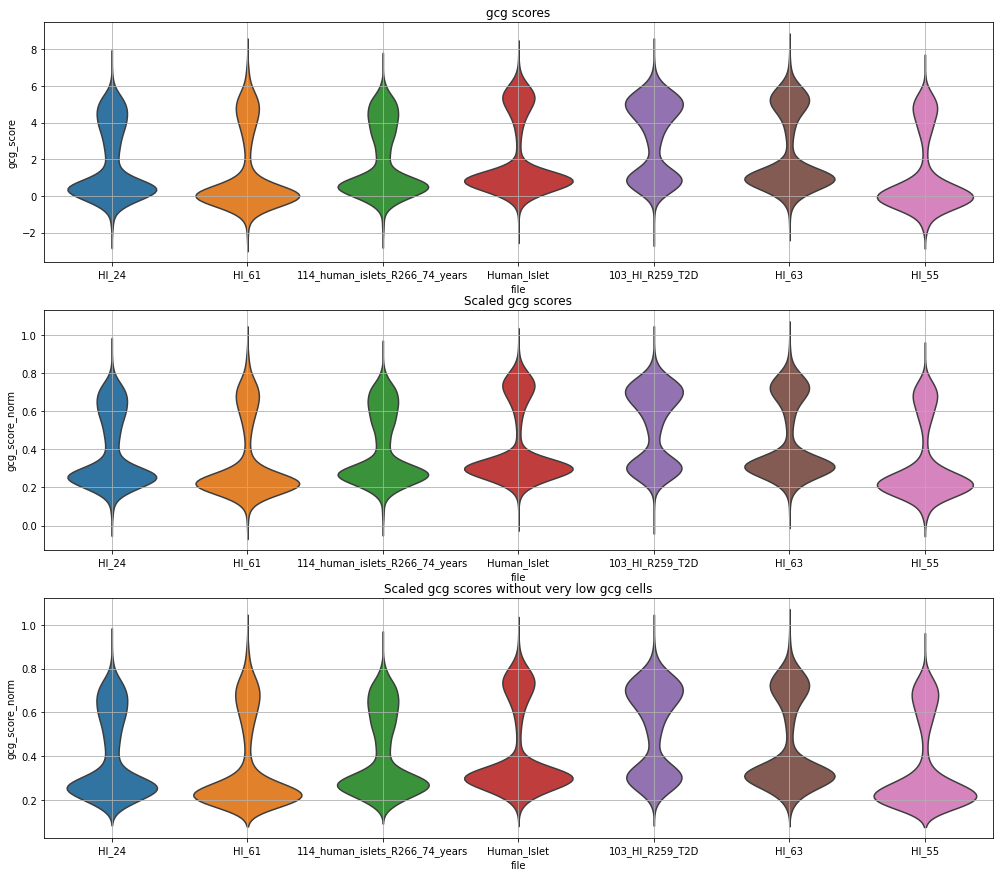

In [29]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(17,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.15],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [30]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'HI_24':0.4,'HI_61':0.425,'114_human_islets_R266_74_years':0.425,'Human_Islet':0.5,'103_HI_R259_T2D':0.425,'HI_63':0.5,'HI_55':0.45}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of gcg high across samples:


file                            gcg_high
HI_24                           False       0.611546
                                True        0.388454
HI_61                           False       0.724724
                                True        0.275276
114_human_islets_R266_74_years  False       0.617235
                                True        0.382765
Human_Islet                     False       0.702395
                                True        0.297605
103_HI_R259_T2D                 False       0.395632
                                True        0.604368
HI_63                           False       0.636092
                                True        0.363908
HI_55                           False       0.750894
                                True        0.249106
Name: gcg_high, dtype: float64

In [31]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

#### SST

In [32]:
genes=['SST']
score_name='sst'
'SST' in adata_rawnorm.var_names

True

In [33]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_12583/1638758935.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


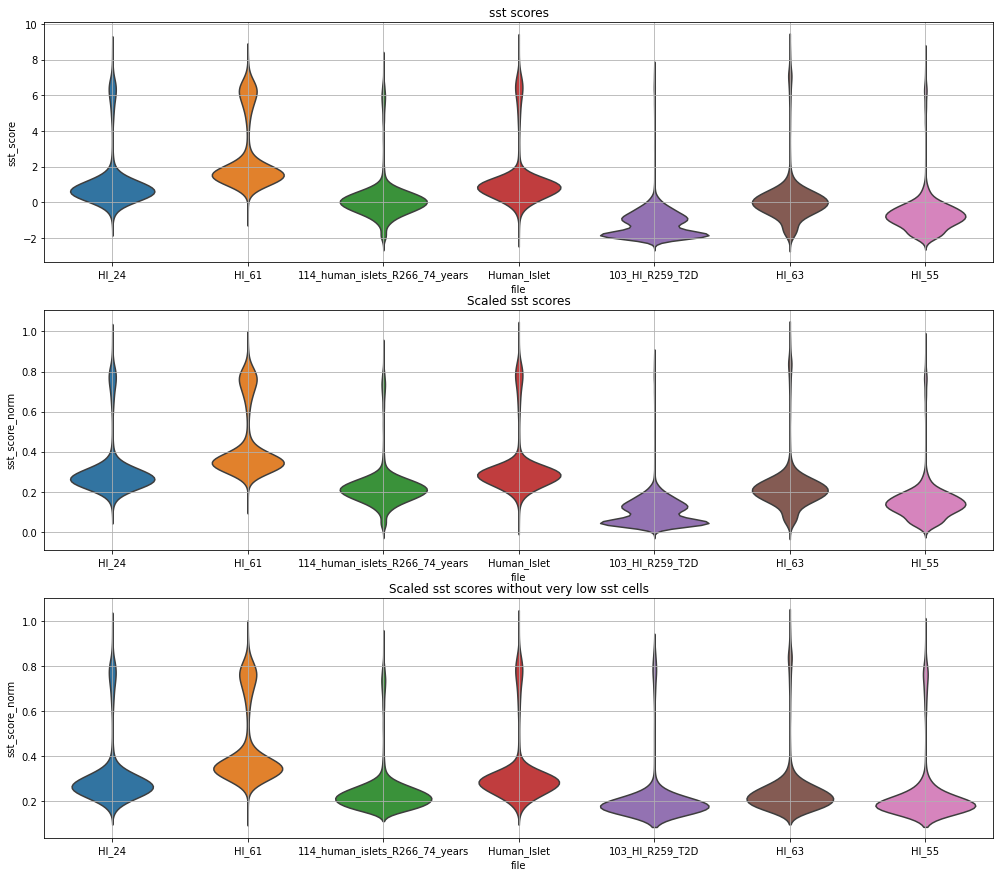

In [34]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(17,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.15],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [35]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'HI_24':0.55,'HI_61':0.575,'114_human_islets_R266_74_years':0.5,'Human_Islet':0.5,'103_HI_R259_T2D':0.5,'HI_63':0.55,'HI_55':0.5}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of sst high across samples:


file                            sst_high
HI_24                           False       0.897583
                                True        0.102417
HI_61                           False       0.754206
                                True        0.245794
114_human_islets_R266_74_years  False       0.954132
                                True        0.045868
Human_Islet                     False       0.887215
                                True        0.112785
103_HI_R259_T2D                 False       0.988496
                                True        0.011504
HI_63                           False       0.952924
                                True        0.047076
HI_55                           False       0.969365
                                True        0.030635
Name: sst_high, dtype: float64

In [36]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

#### Ppy

In [37]:
genes=['PPY']
score_name='ppy'
'PPY' in adata_rawnorm.var_names

True

In [38]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_12583/1668997483.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


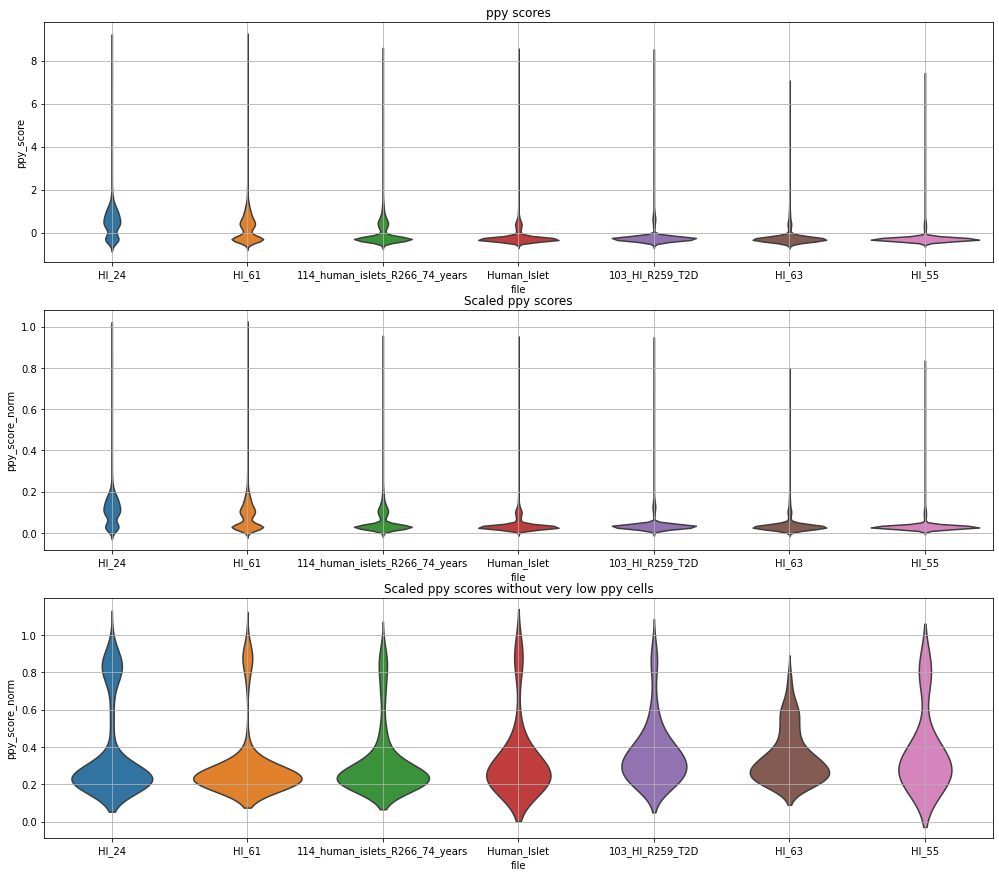

In [39]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(17,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.2],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [40]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'HI_24':0.575,'HI_61':0.6,'114_human_islets_R266_74_years':0.59,'Human_Islet':0.65,'103_HI_R259_T2D':0.7,'HI_63':0.5,'HI_55':0.6}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of ppy high across samples:


file                            ppy_high
HI_24                           False       0.982612
                                True        0.017388
HI_61                           False       0.995994
                                True        0.004006
114_human_islets_R266_74_years  False       0.998075
                                True        0.001925
Human_Islet                     False       0.999228
                                True        0.000772
103_HI_R259_T2D                 False       0.999333
                                True        0.000667
HI_63                           False       0.996824
                                True        0.003176
HI_55                           False       0.999329
                                True        0.000671
Name: ppy_high, dtype: float64

In [41]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

#### Ghrl

In [42]:
genes=['GHRL']
score_name='ghrl'
'GHRL' in adata_rawnorm.var_names

True

In [43]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_12583/1638758935.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


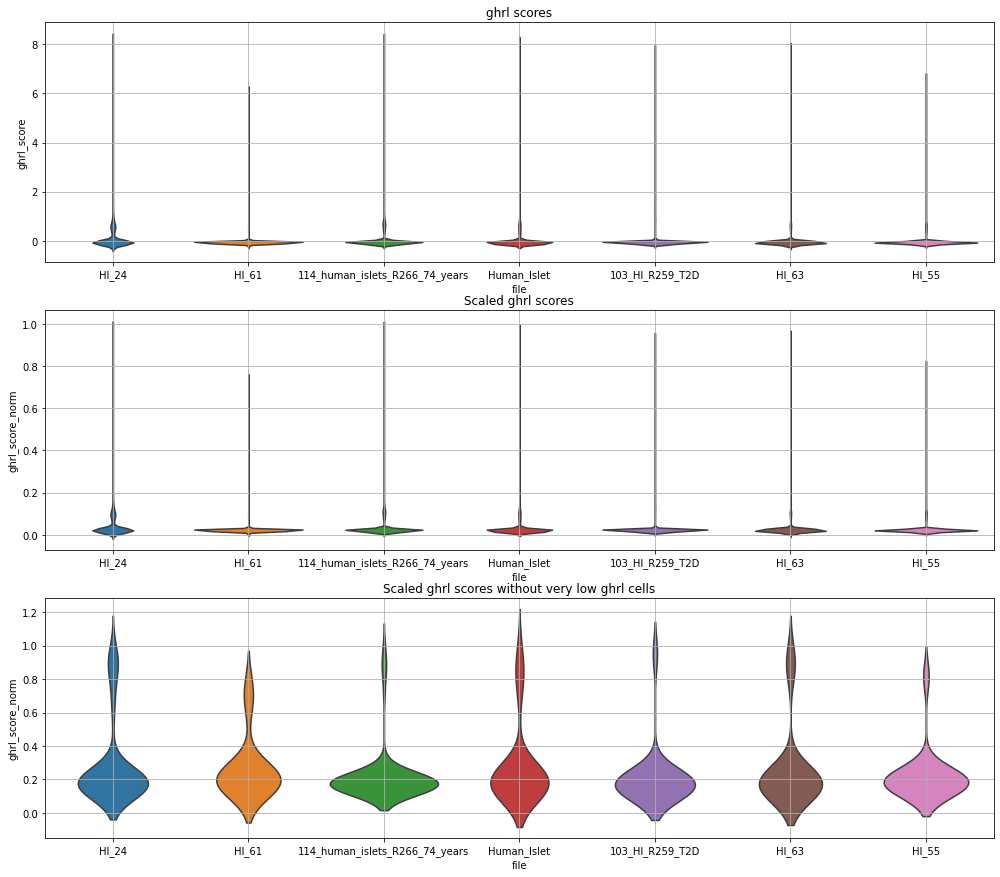

In [44]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(17,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.15],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [45]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'HI_24':0.5,'HI_61':0.5,'114_human_islets_R266_74_years':0.575,'Human_Islet':0.575,'103_HI_R259_T2D':0.6,'HI_63':0.6,'HI_55':0.575}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of ghrl high across samples:


file                            ghrl_high
HI_24                           False        0.996175
                                True         0.003825
HI_61                           False        0.999680
                                True         0.000320
114_human_islets_R266_74_years  False        0.999358
                                True         0.000642
Human_Islet                     False        0.999034
                                True         0.000966
103_HI_R259_T2D                 False        0.999833
                                True         0.000167
HI_63                           False        0.998879
                                True         0.001121
HI_55                           False        0.999776
                                True         0.000224
Name: ghrl_high, dtype: float64

In [46]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

#### Save

In [47]:
#h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)
#adata.write(shared_folder+"data_annotated.h5ad")

## All cell types

## Clustering

#### Leiden clustering on log transformed data.

In [48]:
sc.tl.leiden(adata,resolution=0.4)

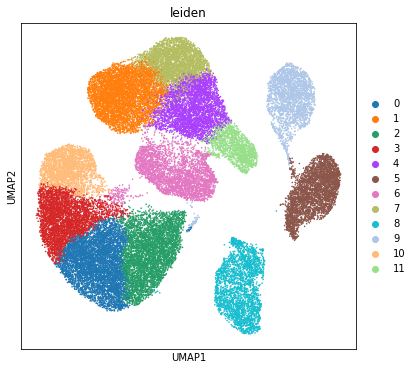

In [49]:
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata, color=['leiden'] ,size=10, use_raw=False)

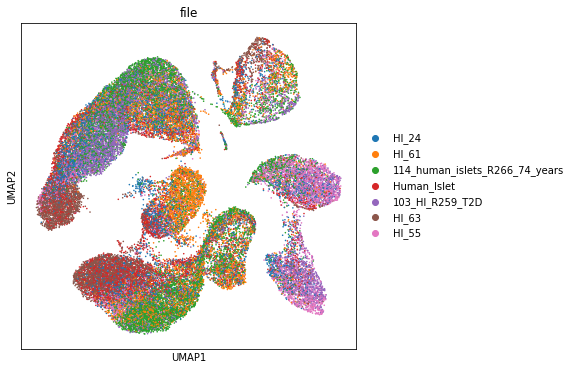

In [50]:
#del adata_scl.uns['sex_colors']
rcParams['figure.figsize']=(6,6)
random_indices=np.random.permutation(list(range(adata_scl.shape[0])))
sc.pl.umap(adata_scl[random_indices,:], color=['file'],     #removed phase_cyclone
           size=10, use_raw=False,wspace=0.3, sort_order=False)

In [51]:
# Clustering resolution
res=1

In [52]:
# Cluster scaled data
sc.tl.leiden(adata_scl, resolution=res, key_added='leiden_scaled_r'+str(res), directed=True, use_weights=True)

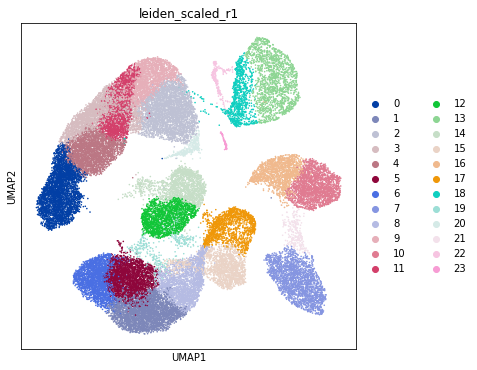

In [53]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r'+str(res)] ,size=10, use_raw=False)

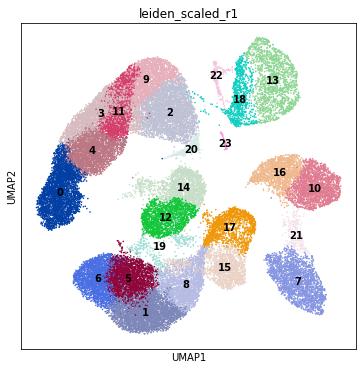

In [54]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r'+str(res)] ,size=10, use_raw=False,
           legend_loc='on data')

#C: Umaps and clusterings on z-scaled data and non-z-scaled data perform similarly. z-scaled data will be used for consistency with other analysed studies.

## Cell type annotation

In [55]:
# Normalise raw data for plotting and cell type scoring
adata_raw=adata_scl.raw.to_adata().copy()
sc.pp.normalize_total(adata_raw, target_sum=1e4, exclude_highly_expressed=True,inplace=False)
sc.pp.log1p(adata_raw)
adata_rawnormalised=adata_scl.copy()
adata_rawnormalised.raw=adata_raw
del adata_raw

In [56]:
# Markers data
marker_data = pd.read_excel('/dss/dsshome1/lxc07/gobi009/hafner/code/marker_genes_collection.xlsx', sheet_name='Collection table')

In [57]:
# Load orthologues so that mice markers can be also checked out
orthologues=pd.read_table('/dss/dsshome1/lxc07/gobi009/hafner/code/orthologues_ORGmus_musculus_ORG2homo_sapiens_V103.tsv')

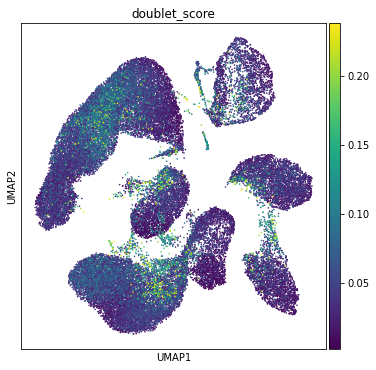

In [58]:
# Plot doublet score
sc.pl.umap(adata_rawnormalised, color='doublet_score',size=10, use_raw=True)

C: It seems that some doublets may be present

('B cell', 'NA')
Missing genes: []


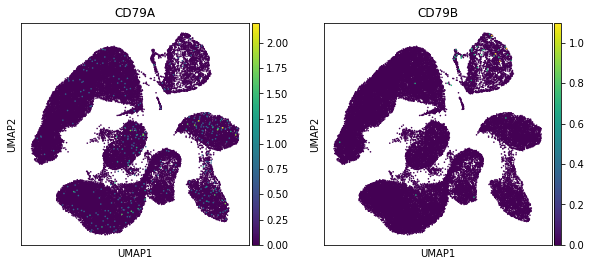

('Schwann cell', 'NA')
Missing genes: ['CMTM5', 'PLP1', 'SOX10']


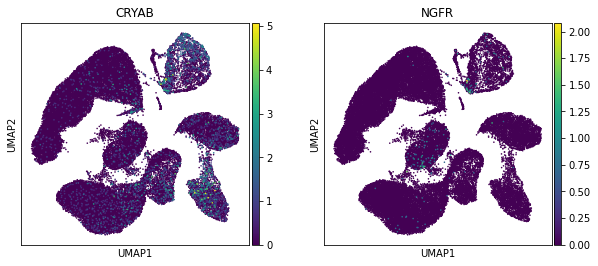

('T cell', 'NA')
Missing genes: ['CD3D']


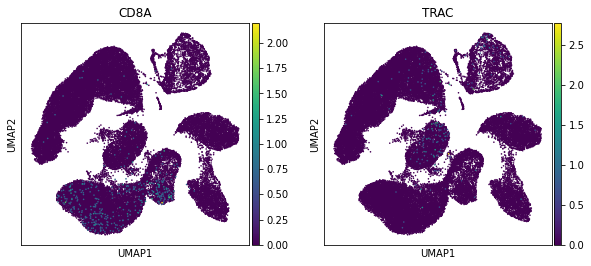

('cytotoxic T cell', 'NA')
Missing genes: ['CD8B']


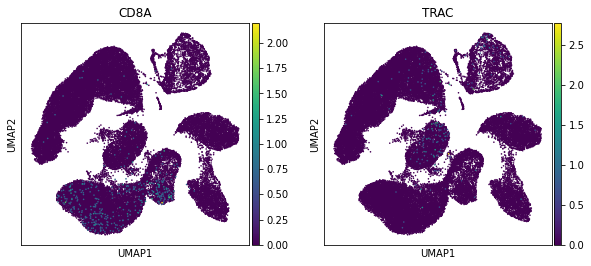

('dendritic cell', 'NA')
Missing genes: ['AC136475.9']


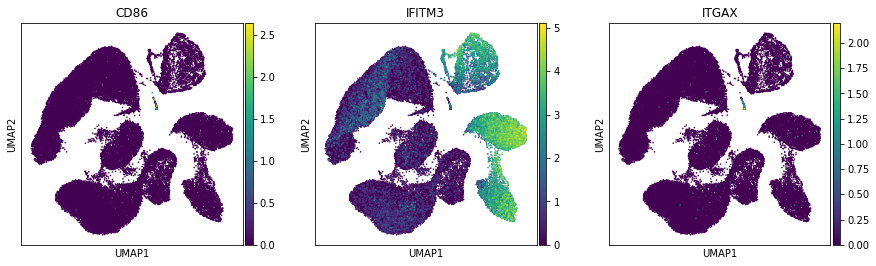

('endothelial cell', 'NA')
Missing genes: []


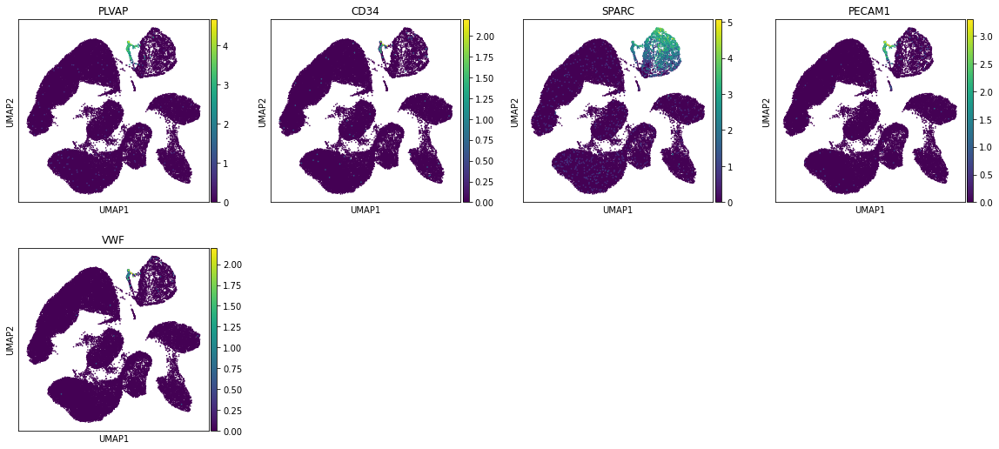

('fibroblast', 'NA')
Missing genes: []


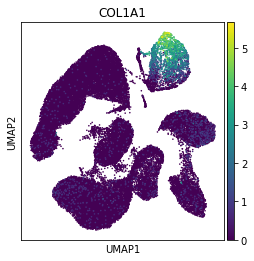

('leukocyte', 'NA')
Missing genes: []


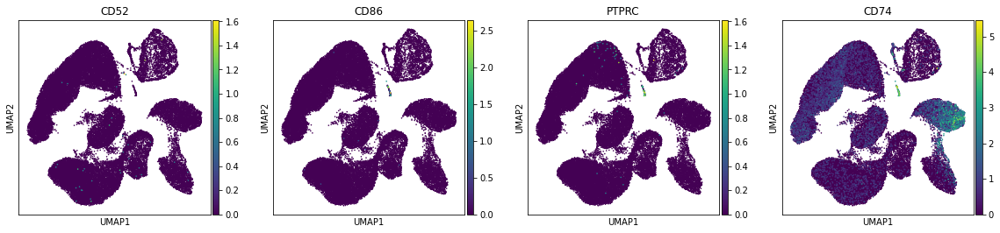

('macrophage', 'NA')
Missing genes: ['ADGRE1']


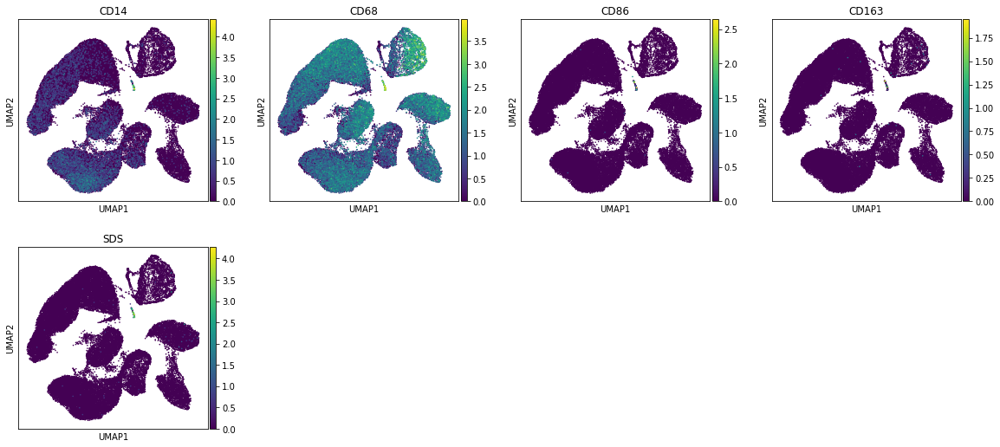

('mast cell', 'NA')
Missing genes: []


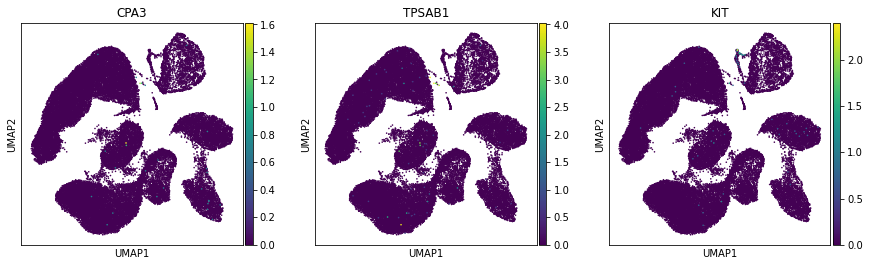

('pancreatic A cell', 'NA')
Missing genes: []


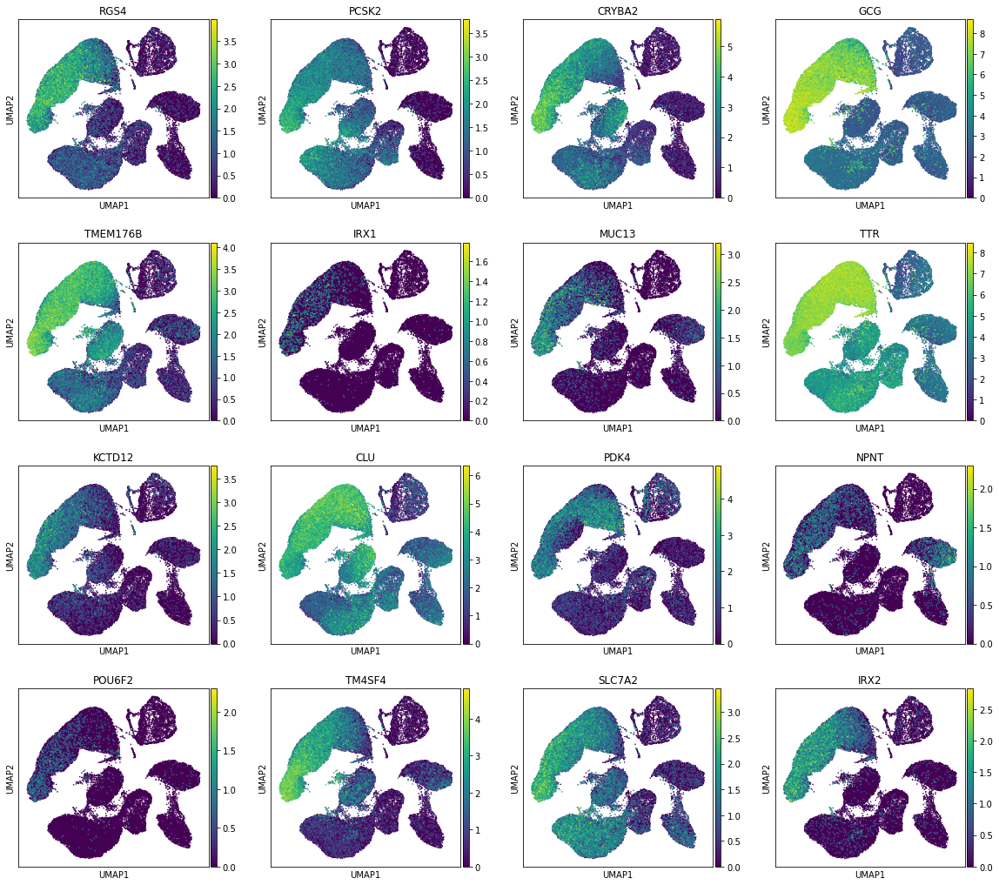

('pancreatic D cell', 'NA')
Missing genes: ['NEUROG3']


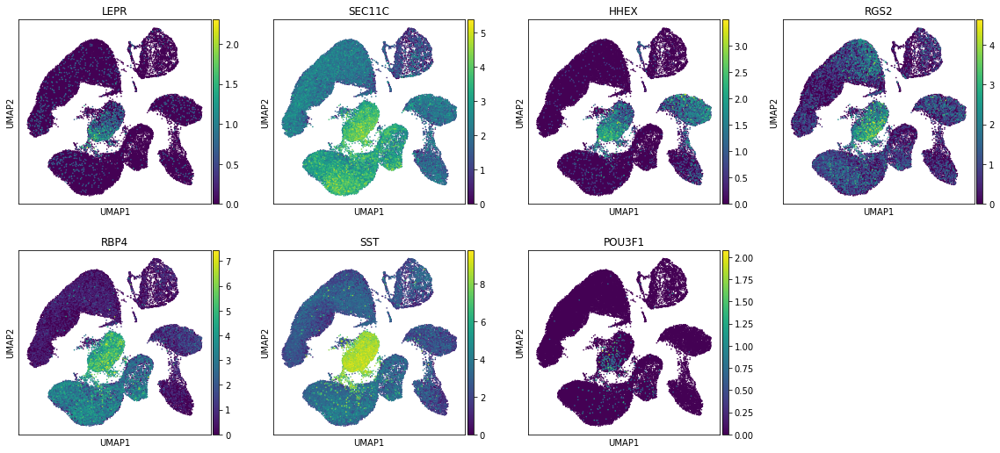

('pancreatic PP cell', 'NA')
Missing genes: []


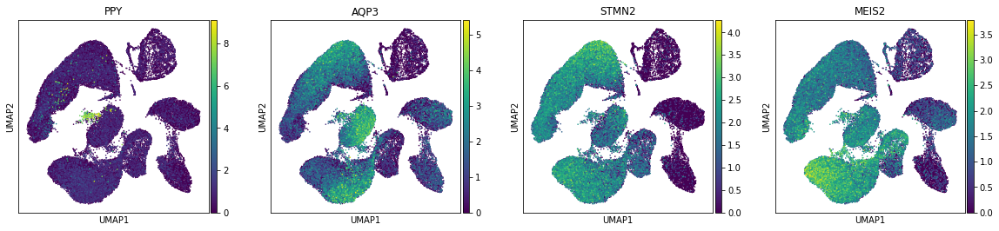

('pancreatic acinar cell', 'NA')
Missing genes: []


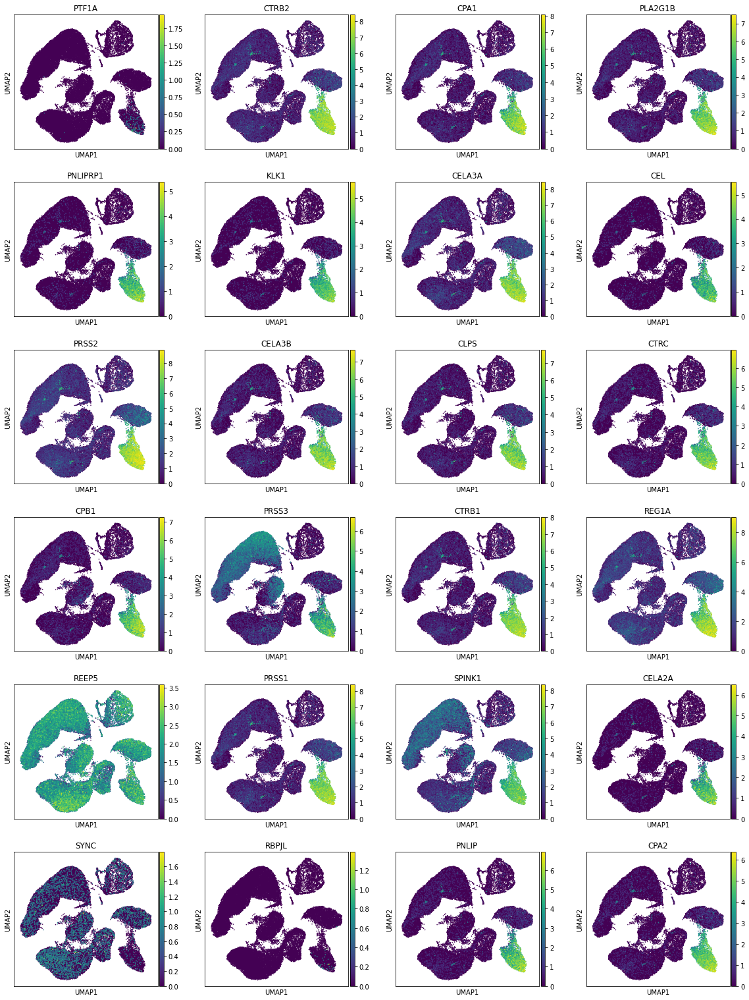

('pancreatic ductal cell', 'NA')
Missing genes: []


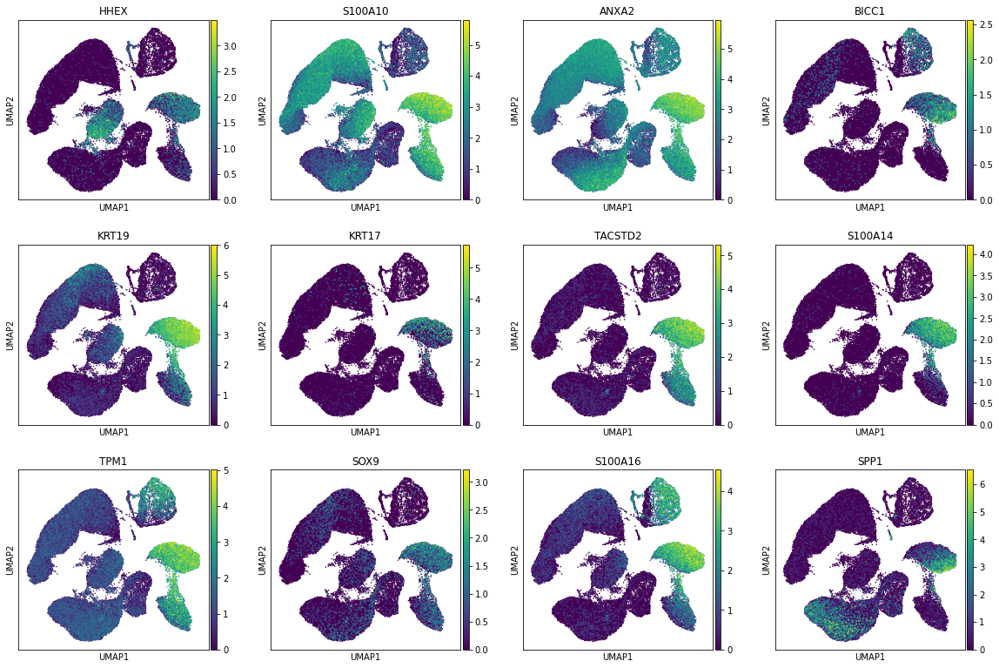

('pancreatic ductal cell', 'mature')
Missing genes: []


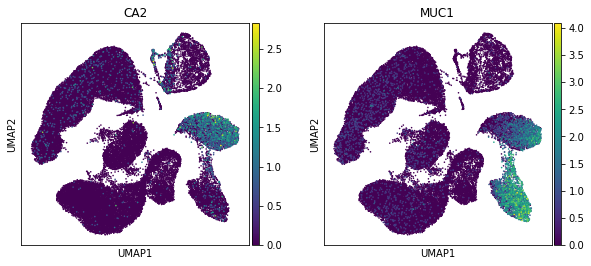

('pancreatic endocrine cell', 'NA')
Missing genes: []


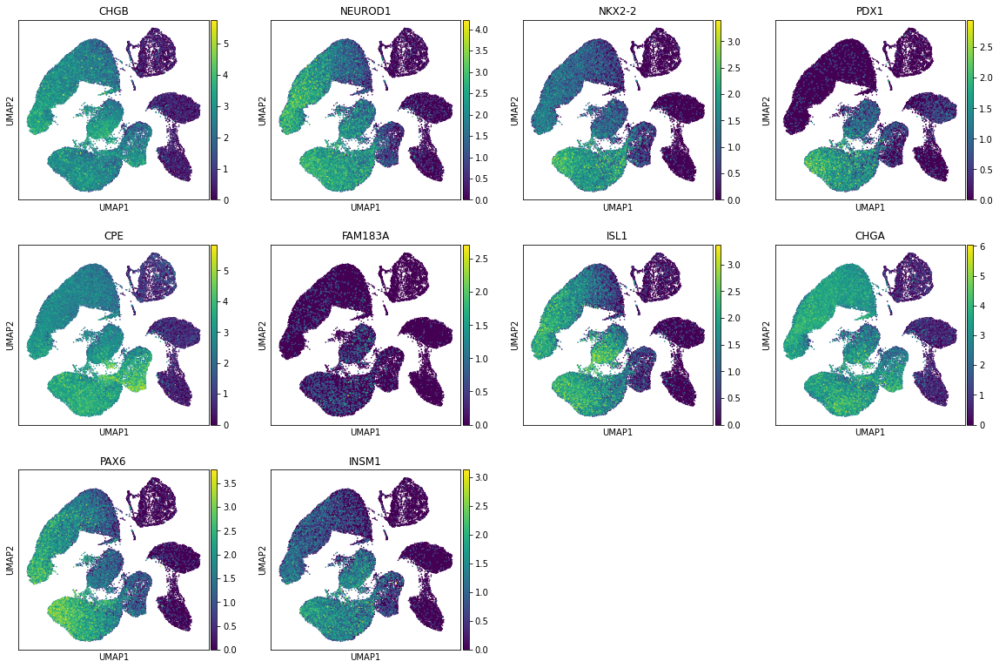

('pancreatic epsilon cell', 'NA')
Missing genes: []


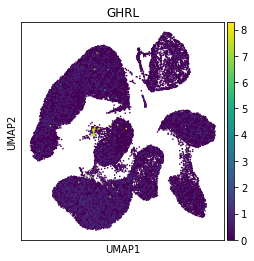

('pancreatic stellate cell', 'NA')
Missing genes: []


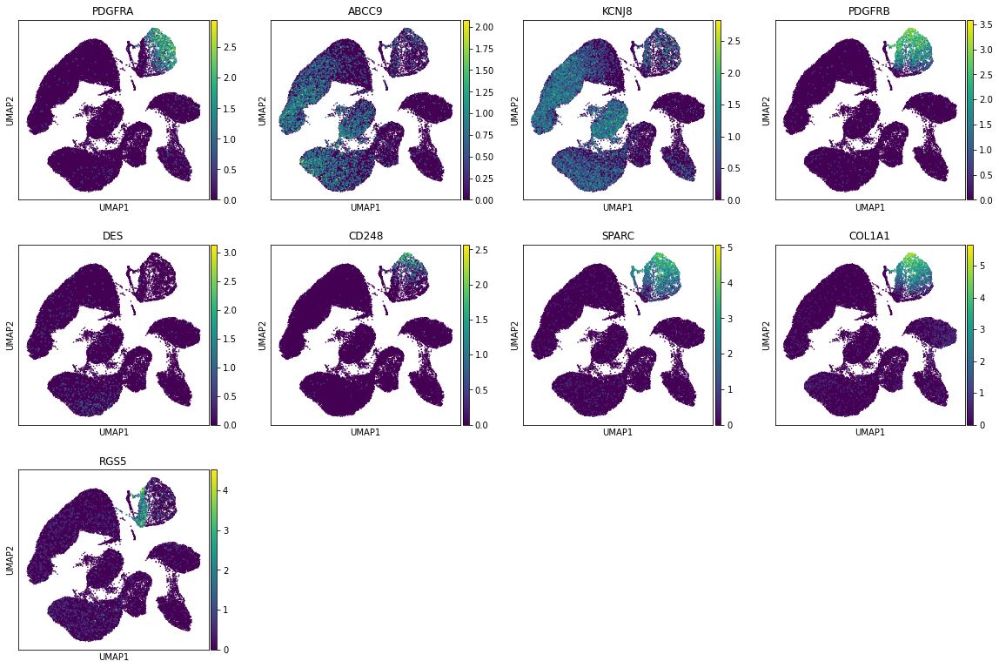

('pancreatic stellate cell', 'activated')
Missing genes: []


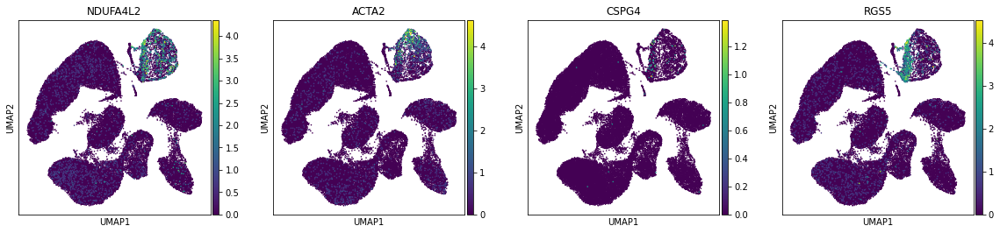

('pancreatic stellate cell', 'quiescent')
Missing genes: []


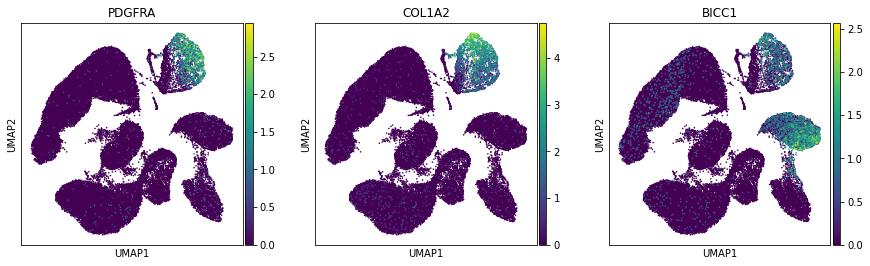

('progenitor cell of endocrine pancreas', 'NA')
Missing genes: []


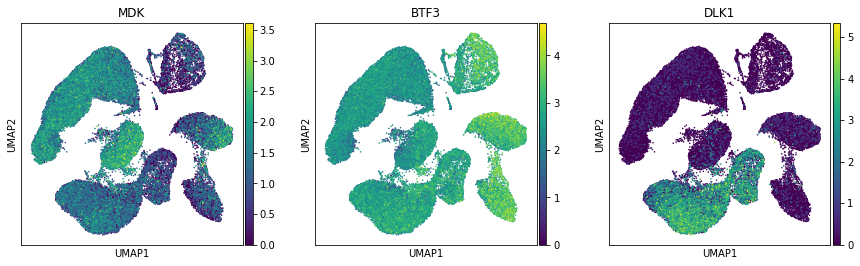

('type B pancreatic cell', 'ER stress')
Missing genes: []


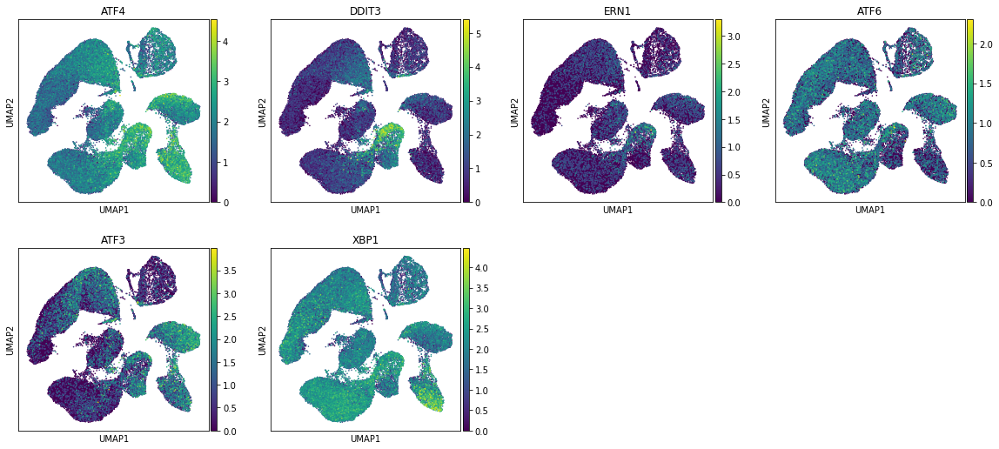

('type B pancreatic cell', 'NA')
Missing genes: []


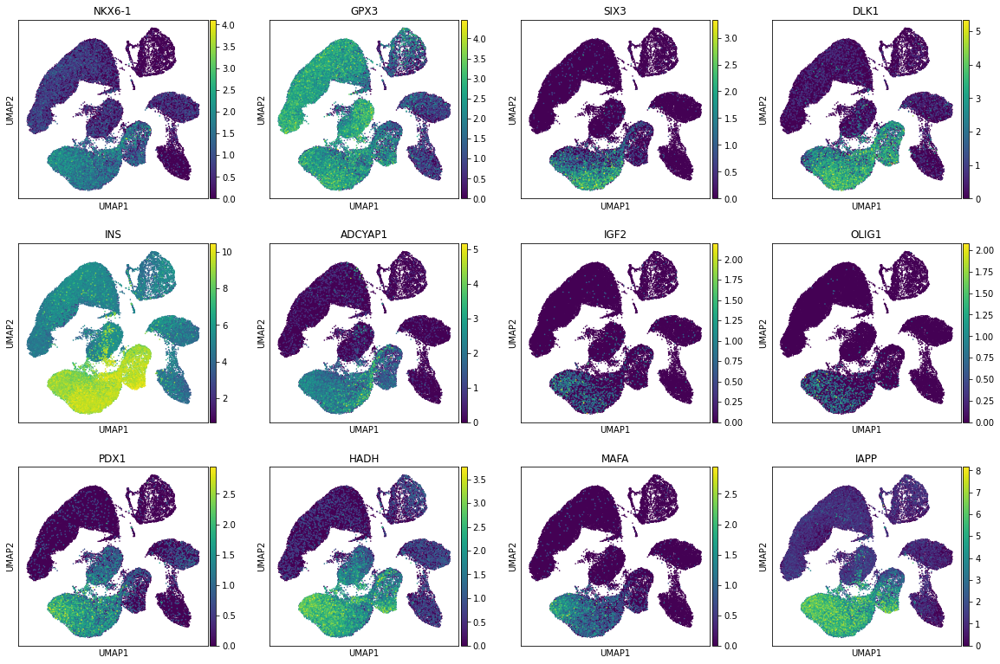

('type B pancreatic cell', 'aging')
Missing genes: []


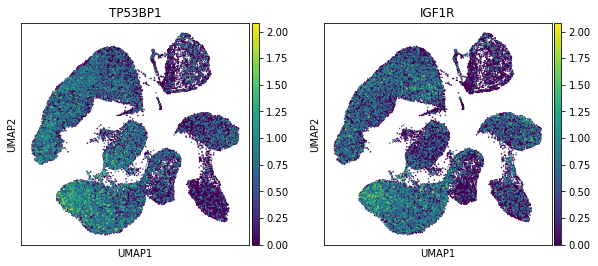

('type B pancreatic cell', 'dedifferentiated')
Missing genes: []


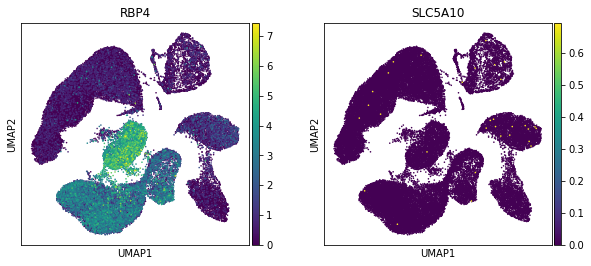

('type B pancreatic cell', 'immature')
Missing genes: []


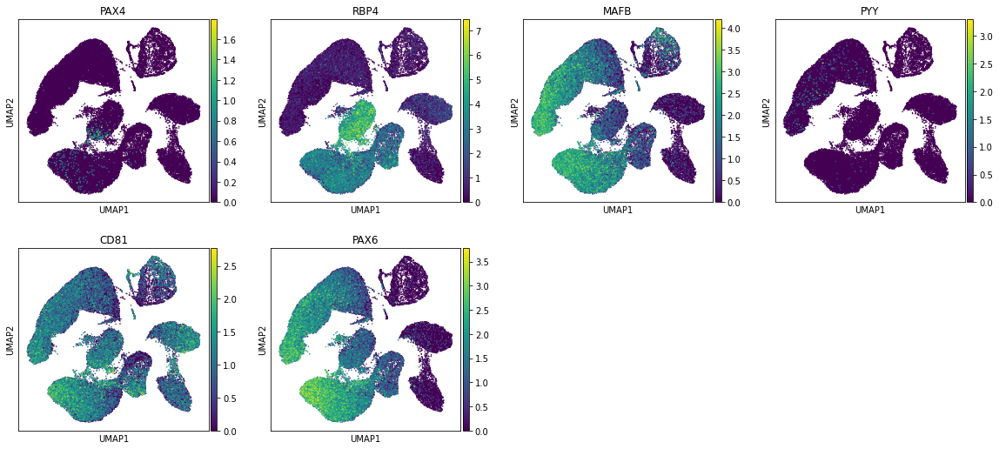

('type B pancreatic cell', 'inflamation')
Missing genes: []


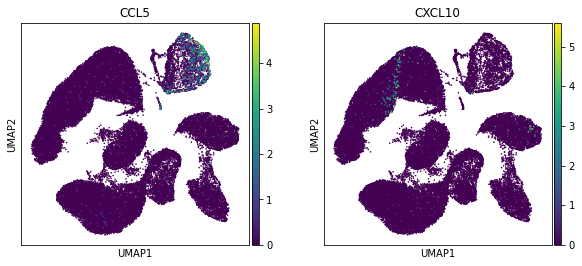

('type B pancreatic cell', 'mature')
Missing genes: []


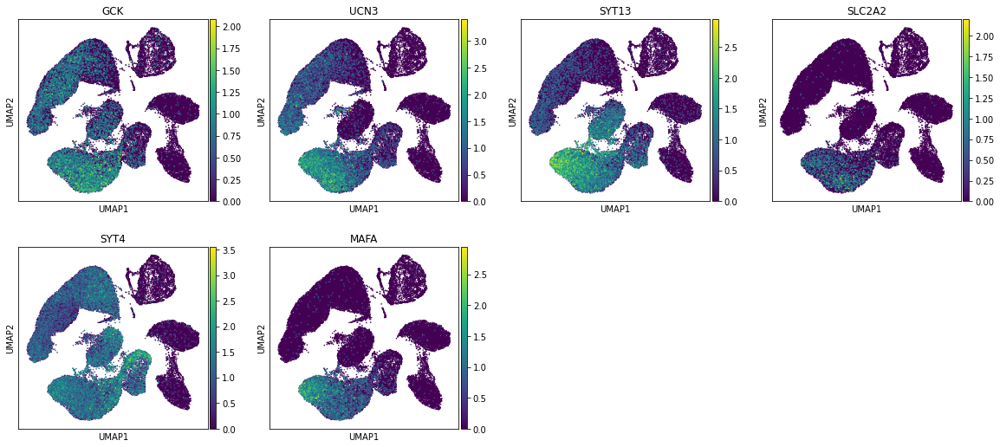

('type B pancreatic cell', 'senescent')
Missing genes: []


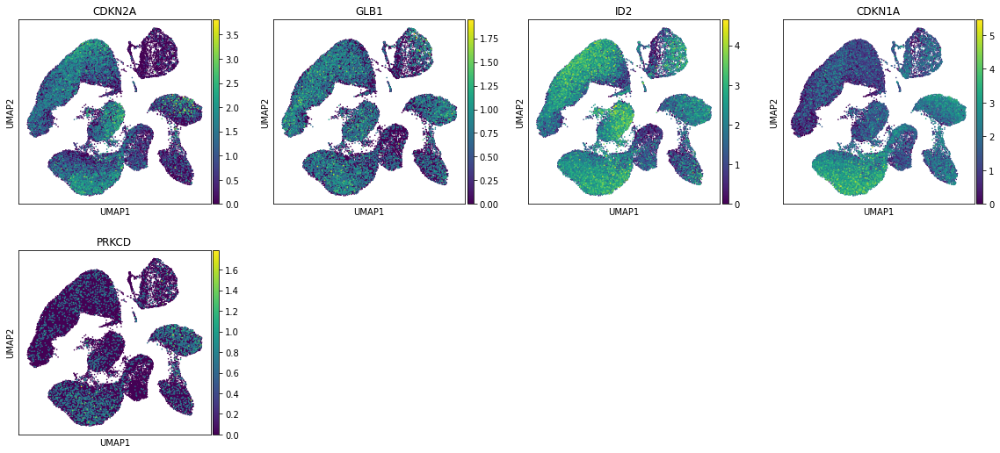

In [59]:
# Plot markers for each cell type
# Fillna as else groupby item iteration does not work well
marker_groups=marker_data.fillna('NA').query('tissue=="pancreas"').groupby(['cell_type','subtype'])
for cell_type,data in marker_groups:
    print(cell_type)
    # For mouse subset to markers that worked
    genes_mouse=set(data.query(' worked==worked & organism=="Mus musculus"').gene_name) # worked==worked removes nan values
    genes_mouse_orthologues=set(orthologues[orthologues['Gene name'].isin(genes_mouse)]['Human gene name'])
    # For mouse also use just upper case representation
    # But exclude those that are not in adata from the start as they amy not be valid human genes
    genes_mouse_upper=set([gene.upper() for gene in genes_mouse if  gene.upper() in adata.var_names])
    # Human gene markers
    genes_human=set(data.query('organism=="Homo sapiens"').gene_name) 
    # Combination of all markers
    genes=genes_human|genes_mouse_upper|genes_mouse_orthologues
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    if len(genes)>0:
        print('Missing genes:',missing)
        rcParams['figure.figsize']=(4,4)
        #sc.pl.umap(adata_rawnormalised, color=['pre_cell_type'],size=10, use_raw=True)
        sc.pl.umap(adata_rawnormalised, color=genes ,size=10, use_raw=True)
    else:
        print('No availiable genes (out of:',missing,')\n')

In [60]:
# Selected markers that seem to be able to distinguish between cell types
# Use only hormone genes for endocrine cells
markers_selection={
    'endothelial':['PECAM1', 'PLVAP'],
    'leukocyte':['PTPRC'],
    'macrophage':['SDS'],
    'alpha':['GCG'],
    'delta':['SST'],
    'gamma':['PPY'],
    'acinar':['CELA3B', 'CLPS', 'CTRB1', 'CPA2', 'PRSS1', 'KLK1', 'PNLIPRP1', 'CTRC', 'CPB1'],
    'ductal':['S100A14'],
    'epsilon':['GHRL'],
    'stellate_activated':['RGS5'],
    'stellate_quiescent':['PDGFRA'],
    'beta':['INS', 'DLK1'] #added DLK1 because of the above error with INS
}

### Marker expression scores
Score each cell for marker expression of each cell type. Cells can thus be annotated qith 0 to N cell types. The presence of annotations is then checked for each cluster.

In [61]:
#Score cells for each cell type

# Save score column names 
scores=[]
for cell_type,genes in markers_selection.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised, gene_list=genes, score_name=score_name,  use_raw=True)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will rai

In [62]:
# Which clusters (column name) to analyse for cell scores
res=1
clusters_col='leiden_scaled_r'+str(res)

In [63]:
# Add cluster information to the used adata
adata_rawnormalised.obs[clusters_col]=adata_scl.obs[clusters_col].copy()

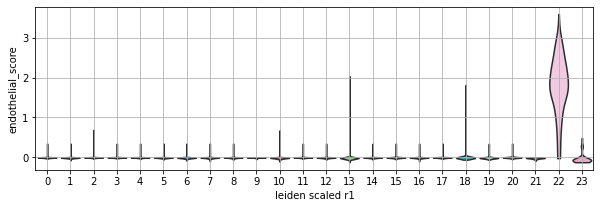

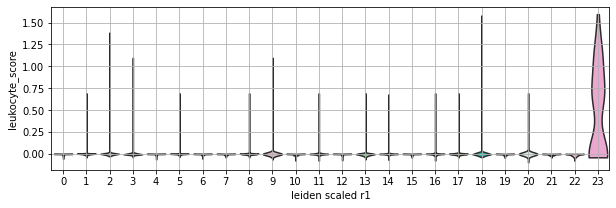

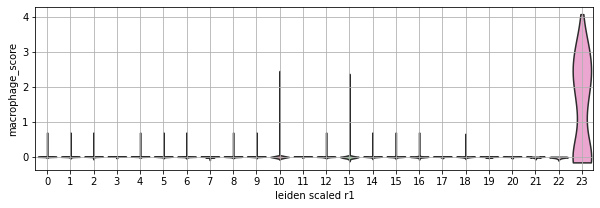

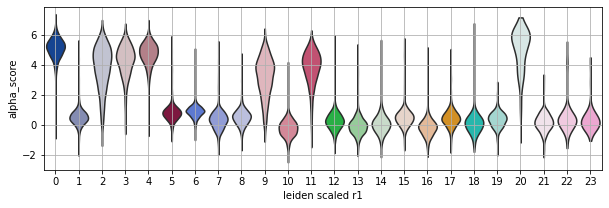

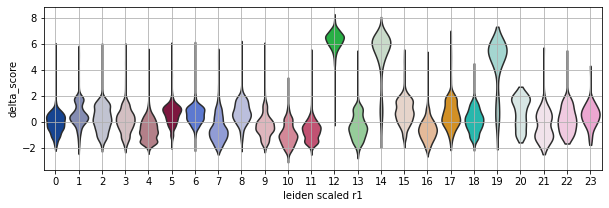

...

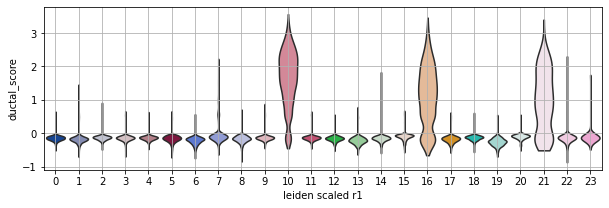

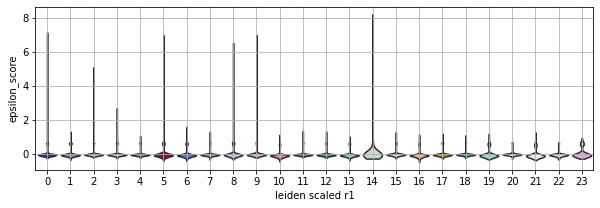

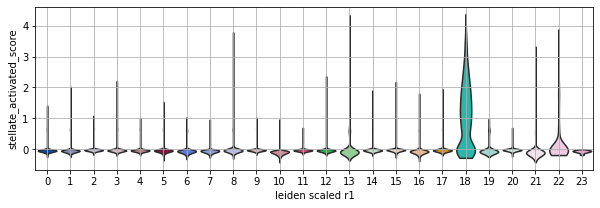

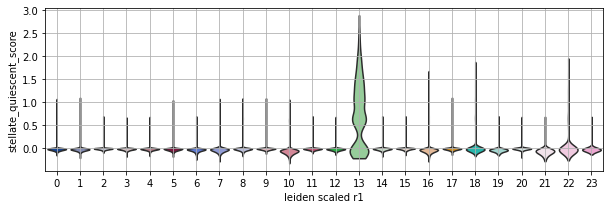

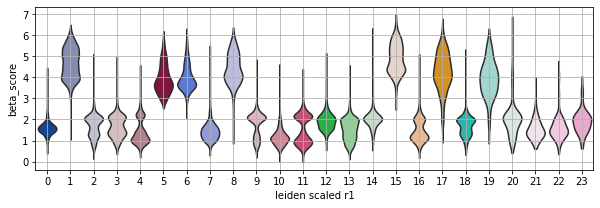

In [64]:
# Plot scores distribution across clusters
rcParams['figure.figsize']=(10,3)
for score in scores:
    fig,ax=plt.subplots()
    sc.pl.violin(adata_rawnormalised, keys=score, groupby=clusters_col, use_raw=True,
                 stripplot=False,ax=ax,show=False)
    ax.grid()

In [65]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df=adata_rawnormalised.obs[scores]
# Do not use normalisation so that it is more comparable to above
#scores_df_norm=pd.DataFrame(pp.minmax_scale(scores_df_norm),columns=scores_df_norm.columns,index=adata_rawnormalised.obs.index)

In [66]:
thresholds_map={
    'endothelial_score':0.15,
    'leukocyte_score':0.4,
    'macrophage_score':0.5,
    'alpha_score':1.8,
    'delta_score':3,
    'gamma_score':4.5,
    'acinar_score':2,
    'ductal_score':0.1,
    'epsilon_score':4.8,
    'stellate_activated_score':0.15,
    'stellate_quiescent_score':0.25,
    'beta_score':2.75
}

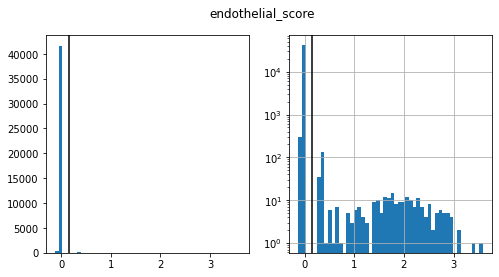

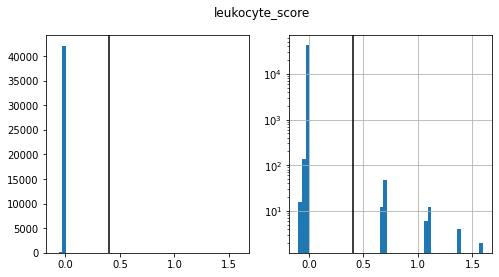

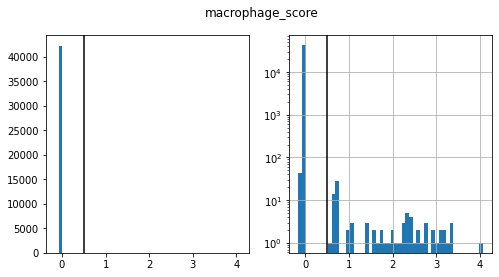

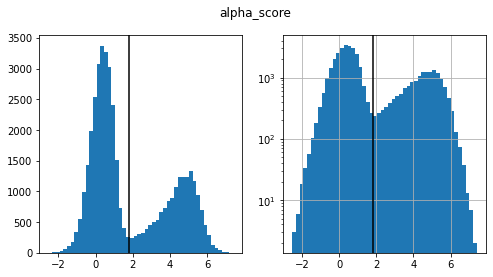

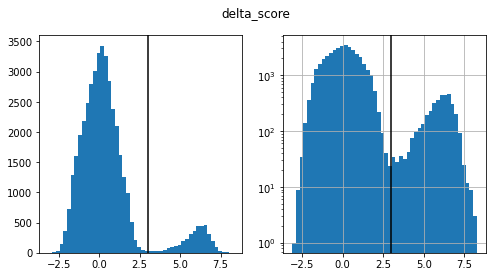

...

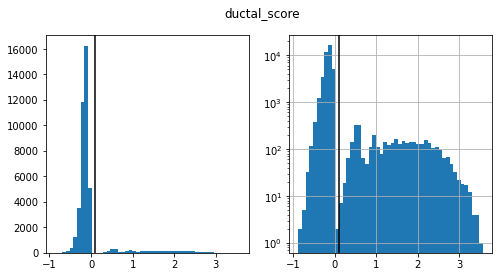

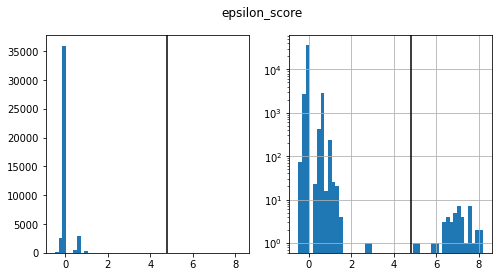

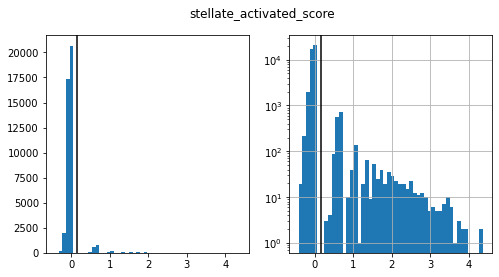

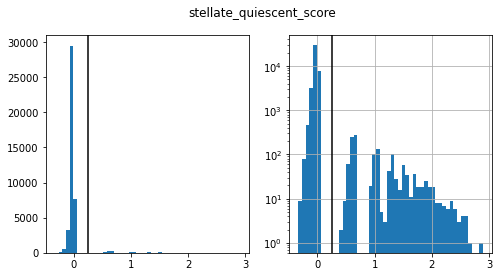

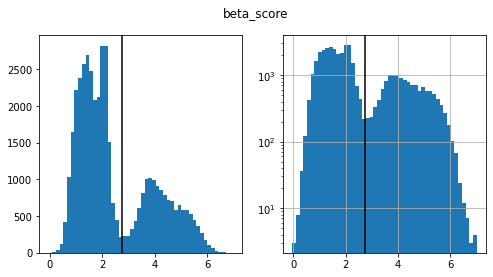

In [67]:
# Distn of scores across all cells to account for different N of cells across clusters
for score in scores_df.columns:
    thr=thresholds_map[score]
    fig,ax=plt.subplots(1,2,figsize=(8,4))
    ax[0].hist(scores_df[score],bins=50)
    ax[1].hist(scores_df[score],bins=50)
    fig.suptitle(score)
    ax[1].set_yscale('log')
    ax[1].grid()
    ax[0].axvline(thr,c='k')
    ax[1].axvline(thr,c='k')

In [68]:
# Thresholds for cell type assignemnt based on normalised scores
thresholds=scores_df.columns.map(thresholds_map)

In [69]:
# Assign cell types based on scores to each cell
assignment_df=scores_df>=thresholds
assignment_df.columns=[col.replace('_score','') for col in scores_df.columns] 

In [70]:
# Count of cells per cell type
assignment_df[[col.replace('_score','') for col in scores_df.columns]].sum()

endothelial             393
leukocyte                83
macrophage               93
alpha                 16133
delta                  3680
gamma                   176
acinar                 2496
ductal                 3875
epsilon                  43
stellate_activated     2060
stellate_quiescent     1343
beta                  14081
dtype: int64

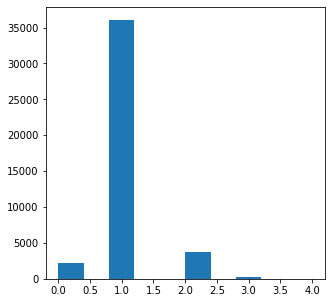

In [71]:
# How many cell types were annotated to each cell
rcParams['figure.figsize']=(5,5)
a=plt.hist(assignment_df.sum(axis=1))

In [72]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions=[]
for idx,row in assignment_df.iterrows():
    type_union=''
    for col in sorted(row.index):
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions.append(type_union.rstrip('_'))

In [73]:
# Add cell types strings of cells to scores/assignment DF
assignment_df['type_union']=type_unions
assignment_df[clusters_col]=adata_rawnormalised.obs[clusters_col].values

### Annotate clusters

In [74]:
# Make DF of marker gene expressions (normalised, log transformed), scaled for each gene to [0,1]
used_markers=list(dict.fromkeys([marker for marker_list in markers_selection.values() for marker in marker_list]))
gene_idx=adata_rawnormalised.raw.var_names.isin(used_markers)
genes=adata_rawnormalised.raw.var_names[gene_idx]
scaled_expression=pd.DataFrame(pp.minmax_scale(adata_rawnormalised.raw.X.toarray()[:, gene_idx]),
                               columns=genes,index=adata_rawnormalised.obs.index
                              )[[marker for marker in used_markers if marker in genes]]

In [75]:
def add_category(df,idxs,col,category):
    """
    Add single value to multiple rows of DF column (useful when column might be categorical). 
    If column is categorical the value is beforehand added in the list of present categories 
    (required for categorical columns). 
    :param df: DF to which to add values
    :param idxs: Index names of rows where the value should be assigned to the column.
    :param col: Column to which to add the value.
    :param category: The value to add to rows,column.
    """
    # If column is already present, is categorical and value is not in categories add the value to categories first.
    if col in df.columns and df[col].dtype.name=='category' and category not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories([category])
    df.loc[idxs,col]=category

In [76]:
def subcluster(adata_cluster,res,original_cluster,assignment_df_temp,clusters_name_prefix='leiden_scaled_r'):
    """
    Cluster adata and add reult into cell type assignment DF. Plot the clustering on UMAP.
    Add name of the original cluster to which the adata belongs to new cluster names.
    Cluster column name: clusters_name_prefix+str(res) 
    :param adata_cluster: Adata (with already computed neighbours and UMAP) to cluster with leiden clustering. 
    :param res: Leiden resolution
    :param original_cluster: Original cluster name, new clusters are named 'original cluster'+'_'+'new cluster'
    :param assignment_df_temp: assignment_df to which to add clusters - should have same row order as adata
    :param clusters_name_prefix: Prefix for cluster column name.
    """
    clusters_col_name=clusters_name_prefix+str(res)
    sc.tl.leiden(adata_cluster, resolution=res, key_added=clusters_col_name, directed=True, use_weights=True)
    adata_cluster.obs[clusters_col_name]=[original_cluster+'_'+subcluster 
                                                 for subcluster in adata_cluster.obs[clusters_col_name]]
    sc.pl.umap(adata_cluster,color=clusters_col_name)
    time.sleep(1.0)
    
    assignment_df_temp['leiden_scaled_r'+str(res)]=adata_cluster.obs['leiden_scaled_r'+str(res)].values
    
def get_cluster_data(adata_original, cluster,cluster_col,assignment_df):
    """
    Subset adata and assignment_df to cluster.
    :param adata_original: Adata to subset.
    :param  cluster: Cluster for which to extract the data.
    :param cluster_col: Column where clusters are listed. Should be present in adata and assignment_df.
    :param assignment_df: DF with cell type assignmnets in column 'type_union' and cluster info. Should have index names
    that are present in adata.obs.index.
    :return: Subset of adata, assignment_df
    """
    adata_temp=adata_original[adata_original.obs[cluster_col]==cluster].copy()
    assignment_df_temp=pd.DataFrame(assignment_df.loc[adata_temp.obs.index,'type_union'])
    return adata_temp, assignment_df_temp

def cluster_annotate(assignment_df,cluster_col,present_threshold,nomain_threshold,
                     save,cluster_annotation,adata_main):
    """
    Loop through clusters, check present cell types and if there is no main cell type plot expression and QC metrics.
    For each cluster list proportion of present cell types.
    Expression (normalised, log transformed, [0,1] per gene scaled) is plotted for marker genes across cells (heatmap).
    QC metrics are plotted as scatterplot of N genes and N counts with cluster cells overlayed over all cels.
    :param assignment_df: DF with cell type assignment in column 'type_union' and cluster assignment.
    :param cluster_col: Cluster column name in assignment_df.
    :param present_threshold: Count among present cell types each cell type present if it represents 
    at least present_threshold proportion of cells in cluster. 
    :param nomain_threshold: If only 1 cell type was selected with present_threshold and 
    no cell type is present at proportion at least nomain_threshold add 'other' to annotated cell types list.
    :param save: Save cluster information to adata_main (column 'cluster') and cell types list to cluster_annotation.
    :param cluster_annotation: Dict where each cluster (key) has list of annotated cell types (value).
    :param adata_main: Add cluster to adata_main.obs.cluster. Use this adata for plotting of QC mettrics (for this a
    column 'temp_selected' is added.)
    """
    for group in assignment_df[['type_union',cluster_col]].groupby(cluster_col):
        types_summary=group[1].type_union.value_counts(normalize=True)
        present=list(types_summary[types_summary >= present_threshold].index)
        if len(present)==1 and types_summary.max() < nomain_threshold:
            present.append('other')
            
        if save:
            cluster_annotation[group[0]]=present
            add_category(df=adata_main.obs,idxs=group[1].index,col='cluster',category=group[0])
        
        print('\nCluster:',group[0],'\tsize:',group[1].shape[0])    
        print('Present:',present)
        print(types_summary)
        
        #present_nonna=[cell_type for cell_type in present if cell_type !='NA']
        #if len(present_nonna)!=1:
        if len(present)!=1 or present==['NA']:
            sb.clustermap(
                pd.DataFrame(scaled_expression.loc[group[1].index,:]),
                col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5), vmin=0,vmax=1)
            plt.title('Cluster: '+group[0]+' assigned:'+str(present))
            adata_main.obs['temp_selected']=adata_main.obs.index.isin(group[1].index)
            rcParams['figure.figsize']=(5,5)
            p1 = sc.pl.scatter(adata_main, 'n_counts', 'n_genes', color='temp_selected', size=40,color_map='viridis')
            time.sleep(1.0)

def save_cluster_annotation(adata,cluster_name,cell_types:list,cell_names):
    """
    Save cluster information for a set of cells to cluster_annotation (from outer scope) dictionary and specified adata.
    :param adata: Adata to which to save cluster name for cells. 
    Cluster information is saved to adata.obs in 'cluster' column.
    :param cluster_name: Name of the cluster.
    :param cell_types: List of cell types annotated to the cluster.
    :param cell_names: Cell names (matching adata.obs.index) to which the new cluster is asigned.
    """
    cluster_annotation[cluster_name]=cell_types
    add_category(df=adata.obs,idxs=cell_names,col='cluster',category=cluster_name)

In [77]:
#Save cell types annotated to each cluster
cluster_annotation=dict()


Cluster: 0 	size: 3586
Present: ['alpha']
alpha                               0.933910
alpha_stellate_activated            0.036810
alpha_ductal                        0.006972
alpha_beta                          0.005298
NA                                  0.004183
alpha_endothelial                   0.003904
alpha_stellate_quiescent            0.003346
alpha_gamma                         0.001952
alpha_delta                         0.001115
alpha_macrophage                    0.000558
beta                                0.000558
stellate_activated                  0.000279
alpha_delta_ductal                  0.000279
alpha_endothelial_gamma             0.000279
alpha_ductal_stellate_activated     0.000279
alpha_epsilon_stellate_activated    0.000279
Name: type_union, dtype: float64

Cluster: 1 	size: 3419
Present: ['beta']
beta                                          0.904943
beta_stellate_activated                       0.036268
beta_ductal                                   0.0160

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cluster' as categorical


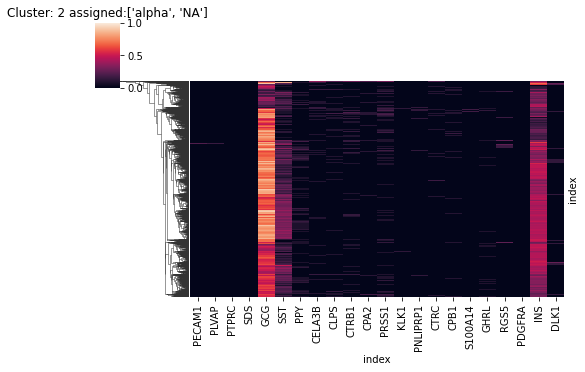

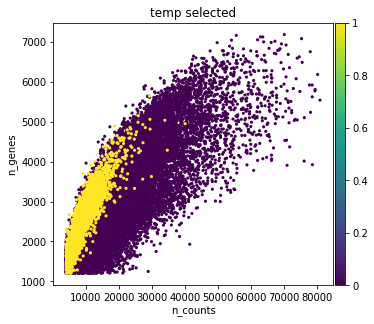


Cluster: 3 	size: 2772
Present: ['alpha']
alpha                                          0.904762
NA                                             0.032468
alpha_stellate_activated                       0.028499
alpha_beta                                     0.014069
alpha_ductal                                   0.006133
alpha_delta                                    0.002886
stellate_activated                             0.002165
alpha_endothelial                              0.002165
gamma                                          0.001082
alpha_stellate_quiescent                       0.001082
alpha_beta_stellate_activated                  0.001082
alpha_gamma                                    0.000722
ductal                                         0.000722
gamma_stellate_quiescent                       0.000361
alpha_ductal_stellate_activated                0.000361
beta                                           0.000361
alpha_beta_delta                               0.000361
alpha

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


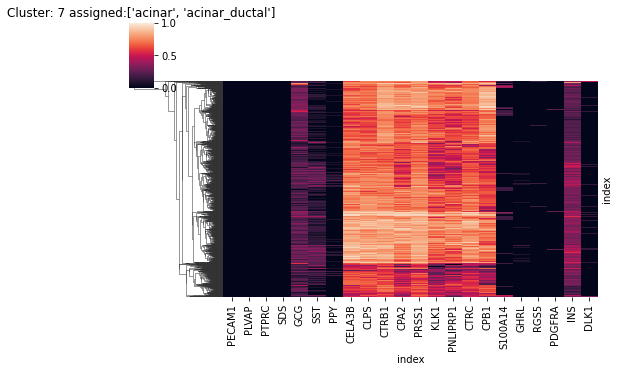

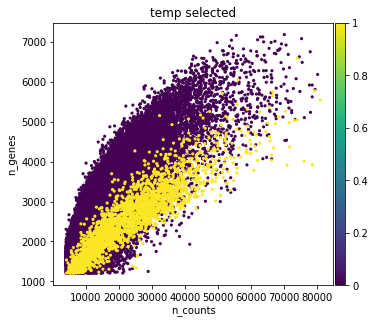


Cluster: 8 	size: 2150
Present: ['beta']
beta                                          0.864186
beta_stellate_activated                       0.042791
alpha_beta                                    0.041860
beta_delta                                    0.013953
NA                                            0.006047
beta_ductal                                   0.005581
beta_stellate_quiescent                       0.004651
beta_delta_stellate_activated                 0.002326
alpha_beta_stellate_activated                 0.002326
beta_stellate_activated_stellate_quiescent    0.001860
beta_epsilon                                  0.001395
beta_macrophage                               0.001395
alpha_beta_ductal                             0.001395
beta_gamma                                    0.001395
alpha                                         0.001395
beta_endothelial                              0.000930
ductal                                        0.000930
beta_ductal_stellate_ac

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


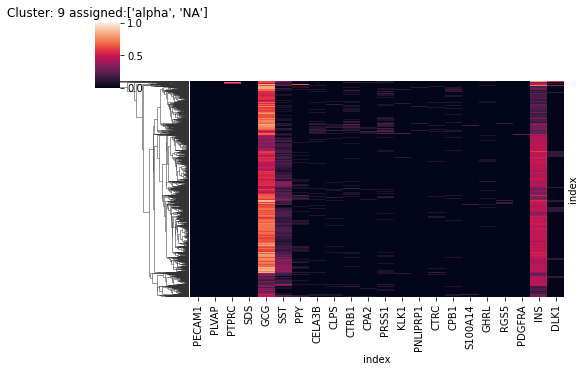

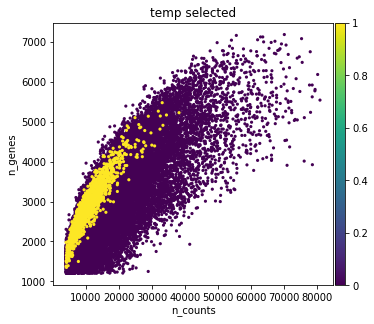


Cluster: 10 	size: 2029
Present: ['ductal']
ductal                                   0.882208
NA                                       0.067521
ductal_stellate_quiescent                0.013307
ductal_stellate_activated                0.011336
ductal_macrophage                        0.006407
alpha_ductal                             0.005914
beta_ductal                              0.003943
ductal_endothelial                       0.001971
acinar_ductal                            0.001971
stellate_activated                       0.001479
macrophage                               0.000986
ductal_endothelial_stellate_activated    0.000493
beta_delta_ductal                        0.000493
stellate_quiescent                       0.000493
alpha_ductal_stellate_activated          0.000493
acinar                                   0.000493
alpha                                    0.000493
Name: type_union, dtype: float64

Cluster: 11 	size: 1923
Present: ['alpha']
alpha                       

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


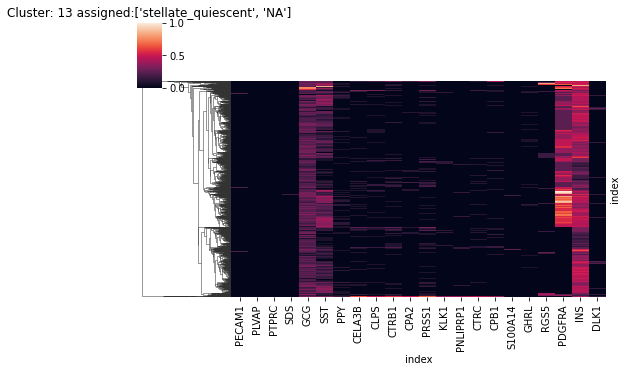

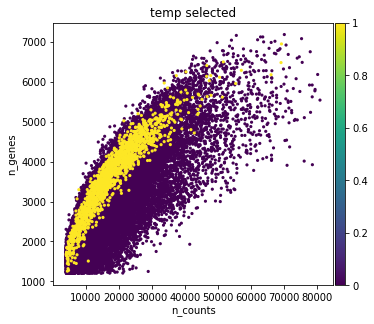


Cluster: 14 	size: 1535
Present: ['delta']
delta                             0.735505
gamma                             0.069055
beta_delta                        0.050814
alpha_delta                       0.041042
NA                                0.030619
delta_stellate_activated          0.018241
epsilon                           0.016287
beta                              0.005863
alpha                             0.003257
alpha_delta_stellate_activated    0.003257
delta_gamma                       0.003257
acinar_delta                      0.002606
beta_epsilon                      0.001954
alpha_beta_delta                  0.001954
gamma_stellate_quiescent          0.001954
delta_stellate_quiescent          0.001954
alpha_beta                        0.001303
beta_delta_stellate_activated     0.001303
delta_endothelial                 0.001303
delta_ductal                      0.001303
stellate_quiescent                0.000651
leukocyte                         0.000651
alpha_stel

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


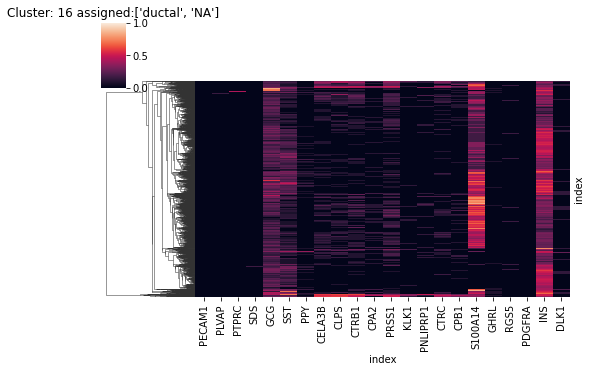

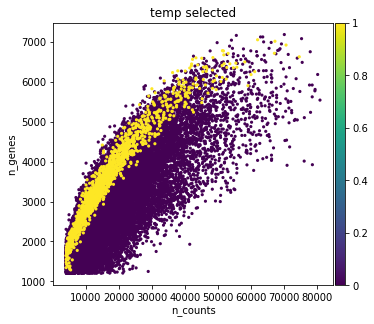


Cluster: 17 	size: 1429
Present: ['beta']
beta                              0.872638
NA                                0.042687
beta_stellate_activated           0.023793
delta                             0.012596
alpha_beta                        0.011896
beta_ductal                       0.009797
beta_delta                        0.007698
beta_stellate_quiescent           0.004199
beta_endothelial                  0.003499
beta_delta_stellate_activated     0.001400
acinar_beta                       0.001400
alpha_beta_stellate_activated     0.001400
stellate_activated                0.001400
alpha                             0.000700
delta_leukocyte                   0.000700
beta_ductal_stellate_activated    0.000700
beta_leukocyte                    0.000700
delta_stellate_activated          0.000700
alpha_delta                       0.000700
beta_gamma                        0.000700
gamma                             0.000700
Name: type_union, dtype: float64

Cluster: 18 	size: 9

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


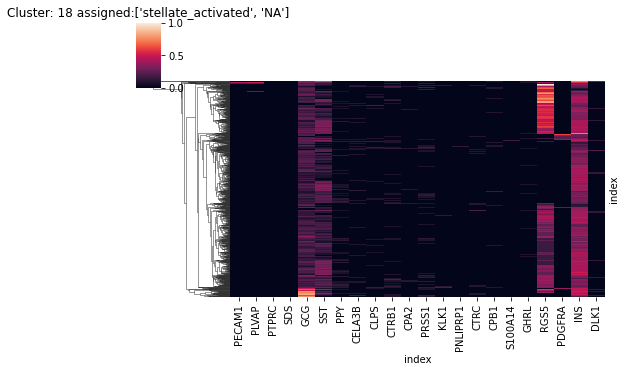

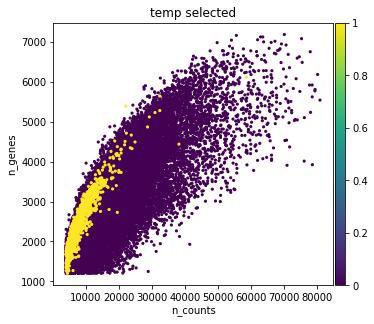


Cluster: 19 	size: 389
Present: ['beta_delta', 'beta']
beta_delta                                   0.652956
beta                                         0.174807
beta_delta_stellate_activated                0.061697
delta                                        0.041131
NA                                           0.028278
alpha_beta_delta                             0.010283
beta_delta_endothelial                       0.007712
beta_delta_stellate_quiescent                0.005141
beta_stellate_activated                      0.005141
beta_delta_gamma                             0.002571
beta_delta_ductal                            0.002571
beta_delta_endothelial_stellate_activated    0.002571
beta_gamma                                   0.002571
delta_stellate_activated                     0.002571
Name: type_union, dtype: float64


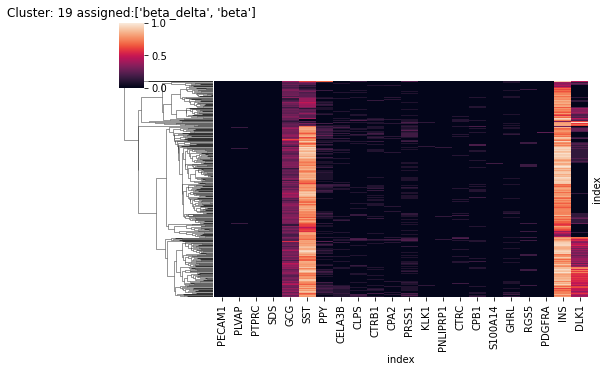

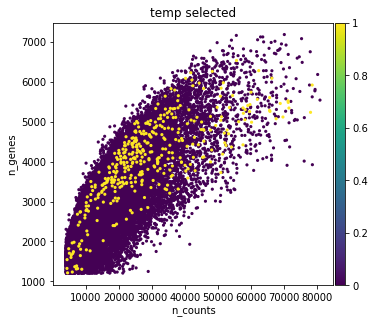


Cluster: 20 	size: 282
Present: ['alpha']
alpha                            0.812057
alpha_beta                       0.092199
NA                               0.039007
alpha_ductal                     0.017730
alpha_stellate_activated         0.010638
alpha_endothelial                0.007092
alpha_leukocyte                  0.007092
alpha_beta_stellate_activated    0.003546
alpha_stellate_quiescent         0.003546
beta                             0.003546
alpha_gamma                      0.003546
Name: type_union, dtype: float64

Cluster: 21 	size: 259
Present: ['acinar_ductal', 'acinar']
acinar_ductal                             0.625483
acinar                                    0.150579
NA                                        0.088803
ductal                                    0.038610
acinar_ductal_stellate_quiescent          0.023166
acinar_ductal_stellate_activated          0.019305
acinar_beta_ductal                        0.011583
acinar_beta                               0.

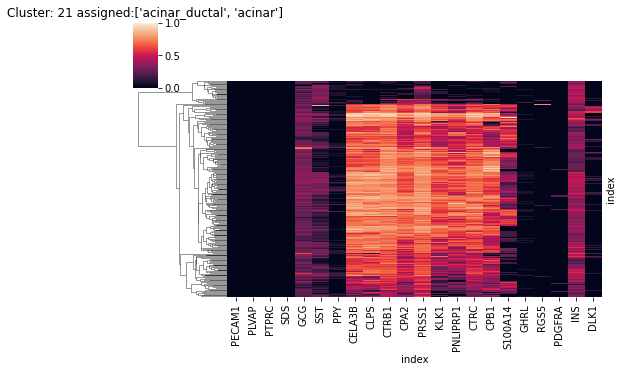

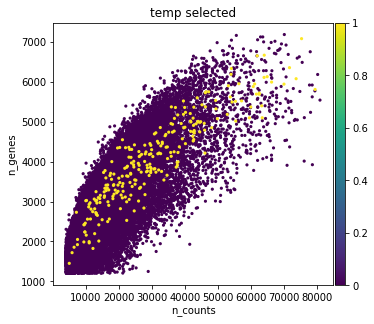


Cluster: 22 	size: 223
Present: ['endothelial', 'other']
endothelial                                          0.690583
endothelial_stellate_activated                       0.085202
alpha_endothelial                                    0.044843
beta_endothelial                                     0.040359
endothelial_stellate_activated_stellate_quiescent    0.040359
NA                                                   0.031390
endothelial_stellate_quiescent                       0.022422
ductal_endothelial_stellate_activated                0.008969
delta_endothelial                                    0.008969
beta_endothelial_stellate_quiescent                  0.004484
beta_delta_endothelial                               0.004484
alpha                                                0.004484
ductal                                               0.004484
alpha_endothelial_stellate_activated                 0.004484
alpha_beta_endothelial                               0.004484
Name: type_u

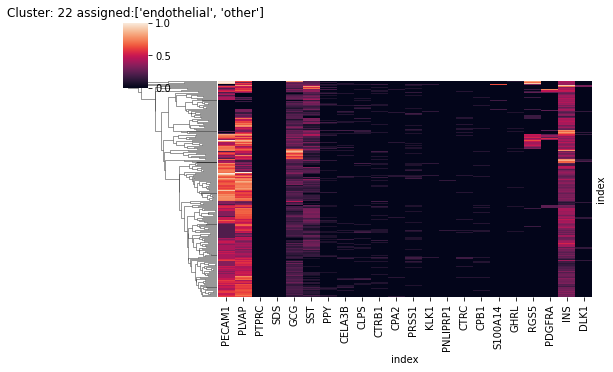

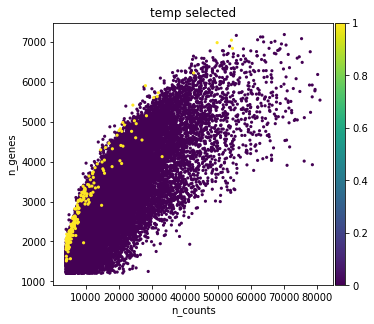


Cluster: 23 	size: 72
Present: ['leukocyte_macrophage', 'macrophage', 'NA', 'leukocyte']
leukocyte_macrophage                       0.236111
macrophage                                 0.208333
NA                                         0.152778
leukocyte                                  0.152778
endothelial_macrophage                     0.055556
endothelial_leukocyte_macrophage           0.041667
beta_macrophage                            0.027778
beta_leukocyte_macrophage                  0.027778
ductal_macrophage                          0.013889
alpha_leukocyte_macrophage                 0.013889
beta_delta_leukocyte_macrophage            0.013889
alpha                                      0.013889
alpha_leukocyte                            0.013889
leukocyte_macrophage_stellate_quiescent    0.013889
endothelial_leukocyte                      0.013889
Name: type_union, dtype: float64


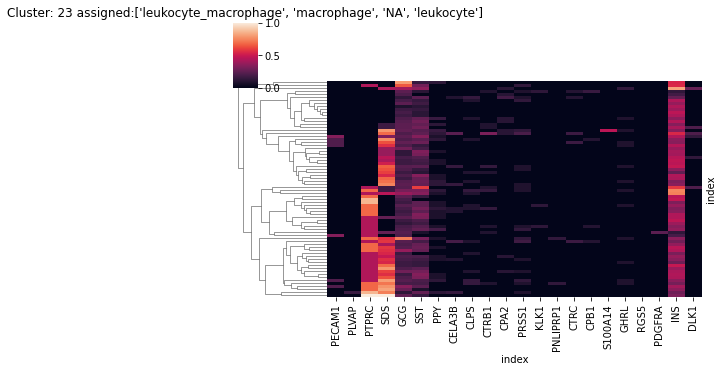

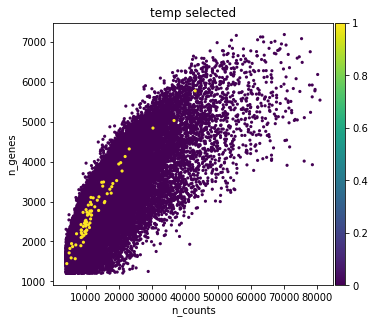

In [78]:
# Display cell type annotation distribution of each cluster.
cluster_annotate(assignment_df=assignment_df,
                 cluster_col=clusters_col,present_threshold=0.1,nomain_threshold=0.7,
                     save=True,cluster_annotation=cluster_annotation,adata_main=adata_rawnormalised)

In [79]:
# Correct annotation
cluster_annotation['2']=['alpha']
cluster_annotation['7']=['acinar']
cluster_annotation['9']=['alpha']
cluster_annotation['13']=['stellate_quiescent']
cluster_annotation['14']=['delta', 'gamma']
cluster_annotation['16']=['ductal']
cluster_annotation['18']=['stellate_activated', 'immune']
cluster_annotation['19']=['beta_delta']
cluster_annotation['21']=['acinar_ductal']
cluster_annotation['22']=['endothelial']
cluster_annotation['23']=['immune']

**** Original cluster 14


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.4' as categorical


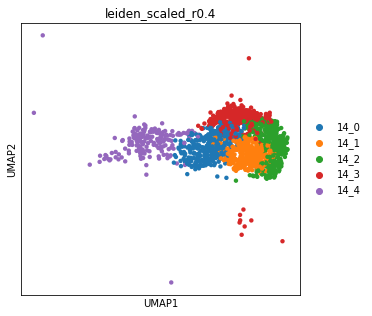


Cluster: 14_0 	size: 371
Present: ['delta', 'other']
delta                            0.757412
beta_delta                       0.080863
alpha_delta                      0.053908
NA                               0.040431
delta_stellate_activated         0.026954
gamma                            0.013477
delta_gamma                      0.005391
delta_endothelial                0.002695
beta                             0.002695
delta_stellate_quiescent         0.002695
beta_delta_stellate_activated    0.002695
alpha                            0.002695
beta_epsilon                     0.002695
epsilon                          0.002695
delta_ductal                     0.002695
Name: type_union, dtype: float64


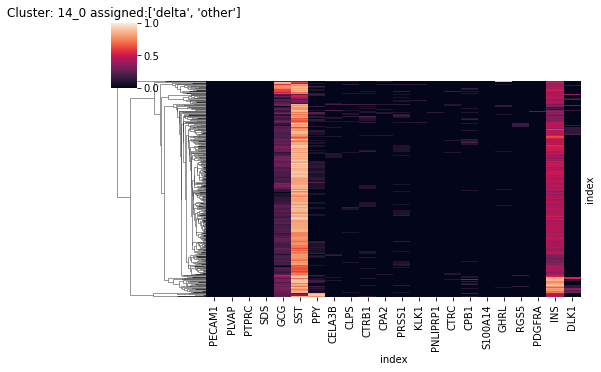

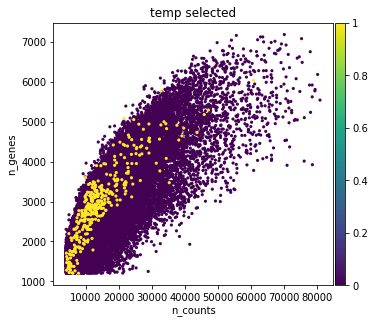


Cluster: 14_1 	size: 334
Present: ['delta']
delta                             0.928144
beta_delta                        0.026946
delta_stellate_activated          0.020958
alpha_delta                       0.008982
NA                                0.005988
alpha_delta_stellate_quiescent    0.002994
alpha_delta_stellate_activated    0.002994
beta                              0.002994
Name: type_union, dtype: float64

Cluster: 14_2 	size: 332
Present: ['delta']
delta                       0.909639
beta_delta                  0.027108
NA                          0.024096
delta_stellate_activated    0.024096
delta_stellate_quiescent    0.006024
alpha_delta                 0.003012
delta_endothelial           0.003012
delta_ductal                0.003012
Name: type_union, dtype: float64

Cluster: 14_3 	size: 320
Present: ['delta', 'other']
delta                            0.721875
beta_delta                       0.090625
NA                               0.056250
gamma                   

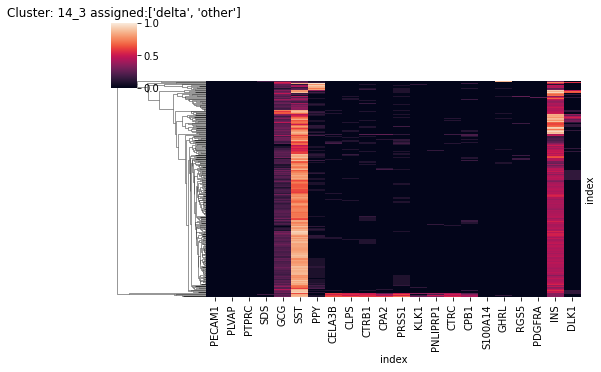

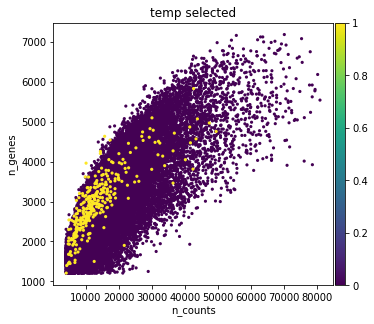


Cluster: 14_4 	size: 178
Present: ['gamma', 'other']
gamma                             0.516854
alpha_delta                       0.179775
epsilon                           0.134831
delta                             0.028090
alpha                             0.022472
alpha_delta_stellate_activated    0.022472
NA                                0.022472
gamma_stellate_quiescent          0.016854
alpha_beta_delta                  0.011236
delta_gamma                       0.011236
epsilon_stellate_activated        0.005618
endothelial_gamma                 0.005618
gamma_stellate_activated          0.005618
alpha_stellate_quiescent          0.005618
beta_epsilon                      0.005618
beta_delta                        0.005618
Name: type_union, dtype: float64


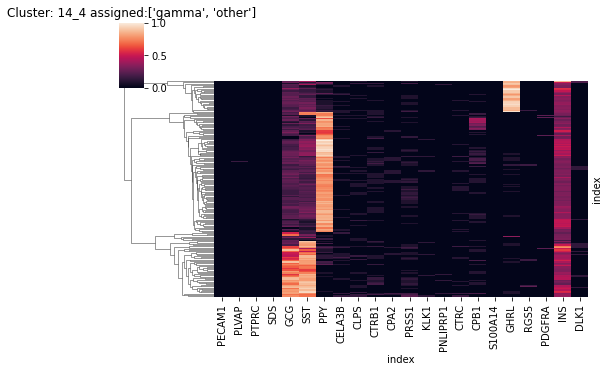

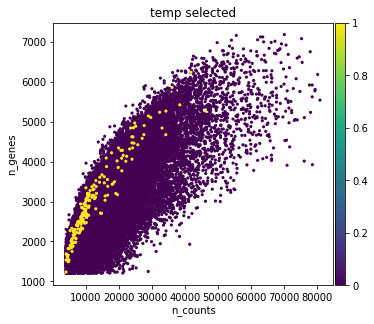

**** Original cluster 18


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.4' as categorical


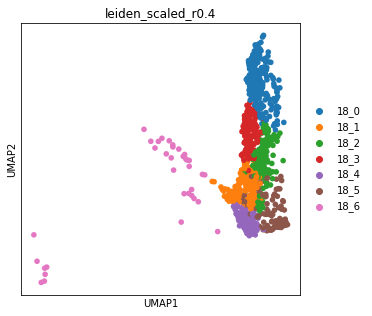


Cluster: 18_0 	size: 236
Present: ['stellate_activated', 'NA']
stellate_activated                       0.677966
NA                                       0.216102
stellate_quiescent                       0.050847
stellate_activated_stellate_quiescent    0.016949
alpha_stellate_activated                 0.008475
endothelial_stellate_activated           0.008475
ductal_stellate_activated                0.004237
alpha_stellate_quiescent                 0.004237
alpha                                    0.004237
delta_stellate_quiescent                 0.004237
ductal                                   0.004237
Name: type_union, dtype: float64


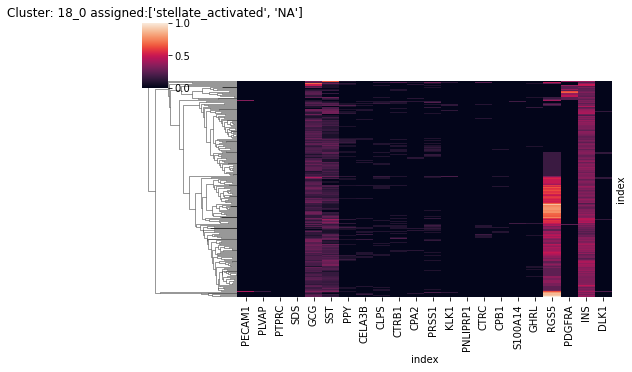

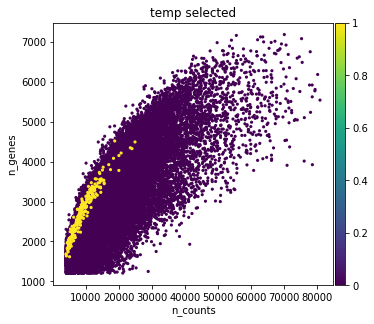


Cluster: 18_1 	size: 184
Present: ['stellate_activated', 'NA']
stellate_activated          0.679348
NA                          0.288043
beta_stellate_activated     0.016304
alpha_stellate_activated    0.010870
ductal                      0.005435
Name: type_union, dtype: float64


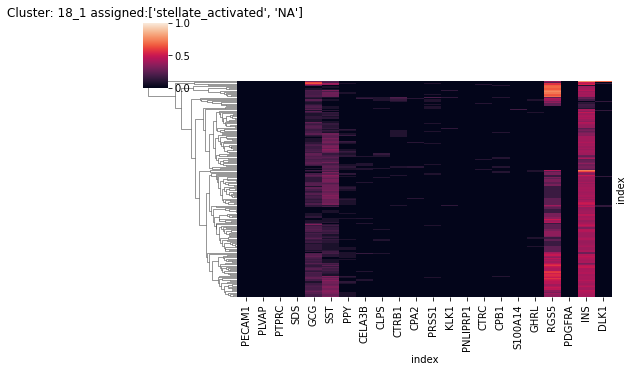

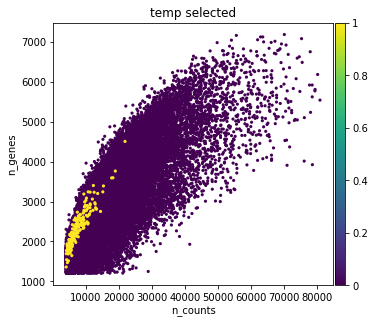


Cluster: 18_2 	size: 142
Present: ['stellate_activated', 'other']
stellate_activated                                   0.781690
NA                                                   0.147887
endothelial_stellate_activated                       0.035211
stellate_quiescent                                   0.014085
endothelial_stellate_activated_stellate_quiescent    0.007042
beta_stellate_activated                              0.007042
endothelial_stellate_quiescent                       0.007042
Name: type_union, dtype: float64


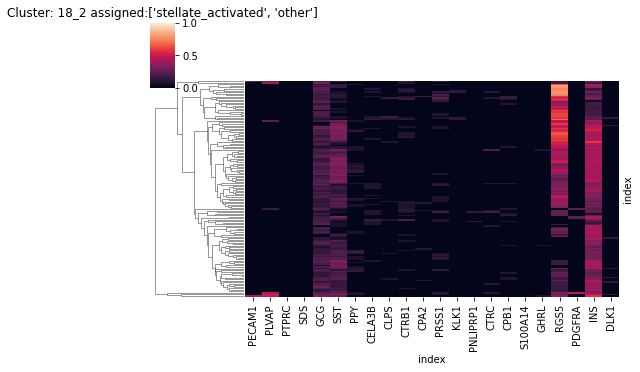

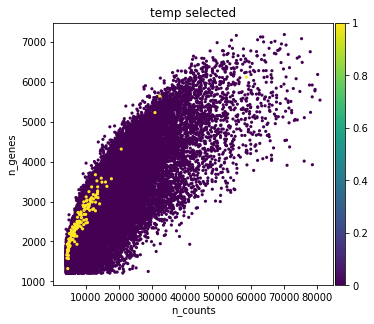


Cluster: 18_3 	size: 141
Present: ['stellate_activated', 'NA']
stellate_activated                0.602837
NA                                0.326241
endothelial_stellate_activated    0.014184
beta_stellate_activated           0.014184
stellate_quiescent                0.014184
leukocyte_stellate_activated      0.007092
alpha_stellate_activated          0.007092
delta_stellate_activated          0.007092
beta                              0.007092
Name: type_union, dtype: float64


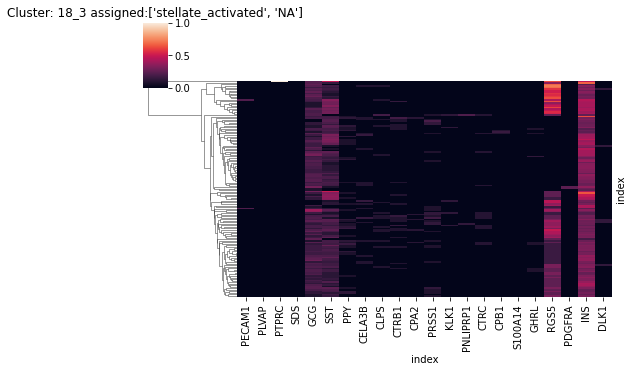

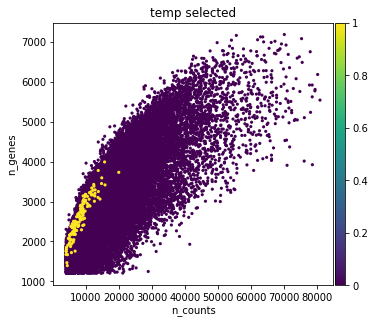


Cluster: 18_4 	size: 111
Present: ['stellate_activated']
stellate_activated                0.837838
NA                                0.126126
endothelial_stellate_activated    0.009009
beta_stellate_activated           0.009009
alpha_beta_stellate_activated     0.009009
acinar_stellate_activated         0.009009
Name: type_union, dtype: float64

Cluster: 18_5 	size: 99
Present: ['NA', 'other']
NA                          0.787879
stellate_activated          0.090909
stellate_quiescent          0.060606
beta                        0.020202
ductal                      0.010101
delta_stellate_activated    0.010101
beta_delta                  0.010101
alpha_stellate_quiescent    0.010101
Name: type_union, dtype: float64


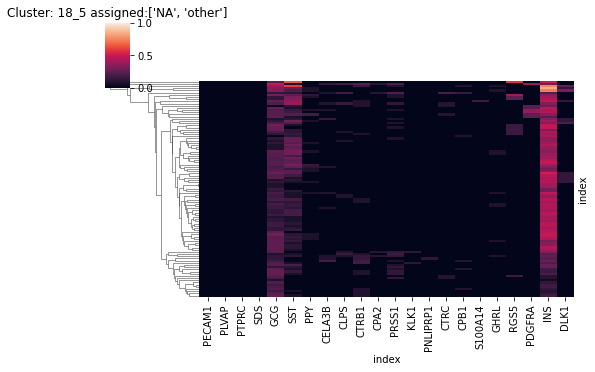

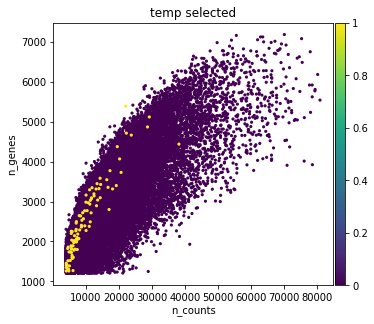


Cluster: 18_6 	size: 35
Present: ['alpha', 'alpha_stellate_activated']
alpha                       0.428571
alpha_stellate_activated    0.342857
NA                          0.114286
stellate_activated          0.028571
alpha_endothelial           0.028571
alpha_stellate_quiescent    0.028571
macrophage                  0.028571
Name: type_union, dtype: float64


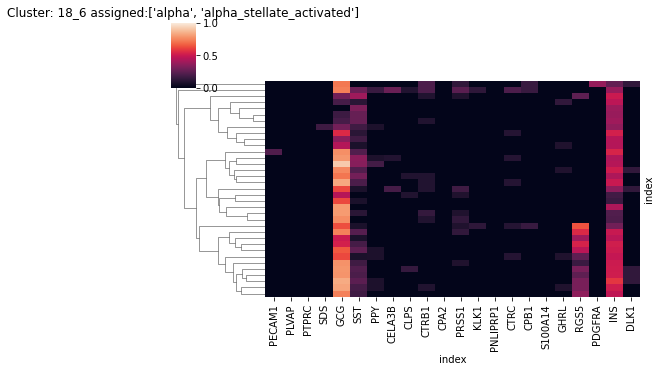

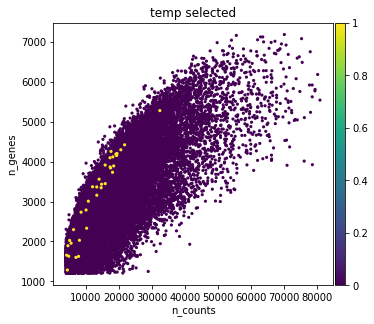

In [80]:
# recluster clusters that previously had less or more than 1 annotted cell type (exclusing  other).
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] ]) == 0:
        print('**** Original cluster',cluster)
        res=0.4
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.2,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

In [81]:
# Correct entries in cluster_annotation dict - all clusters that do not have exactly one entry will be assigned 'NA'
# If cluster is to be removed add 'remove'
cluster_annotation['14_0'] = ['delta']
cluster_annotation['14_3'] = ['delta']
cluster_annotation['14_4'] = ['gamma', 'alpha_delta', 'epsilon']
cluster_annotation['18_0'] = ['stellate_activated']
cluster_annotation['18_1'] = ['stellate_activated']
cluster_annotation['18_2'] = ['stellate_activated']
cluster_annotation['18_3'] = ['stellate_activated']
cluster_annotation['18_5'] = ['NA']
cluster_annotation['18_6'] = ['alpha_stellate_activated']

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.8' as categorical


**** Original cluster 14_4


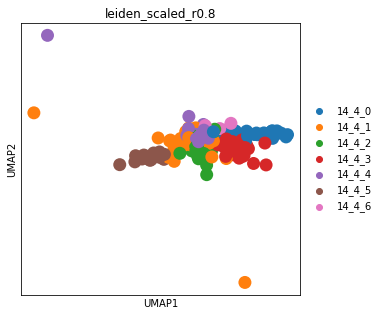


Cluster: 14_4_0 	size: 42
Present: ['gamma']
gamma                             0.833333
alpha_delta_stellate_activated    0.047619
epsilon_stellate_activated        0.023810
delta                             0.023810
epsilon                           0.023810
alpha_stellate_quiescent          0.023810
NA                                0.023810
Name: type_union, dtype: float64

Cluster: 14_4_1 	size: 38
Present: ['gamma']
gamma                       0.842105
alpha                       0.026316
alpha_beta_delta            0.026316
gamma_stellate_quiescent    0.026316
gamma_stellate_activated    0.026316
delta_gamma                 0.026316
beta_epsilon                0.026316
Name: type_union, dtype: float64

Cluster: 14_4_2 	size: 33
Present: ['epsilon', 'other']
epsilon                           0.696970
alpha_delta                       0.181818
alpha_delta_stellate_activated    0.030303
NA                                0.030303
gamma                             0.030303
alpha     

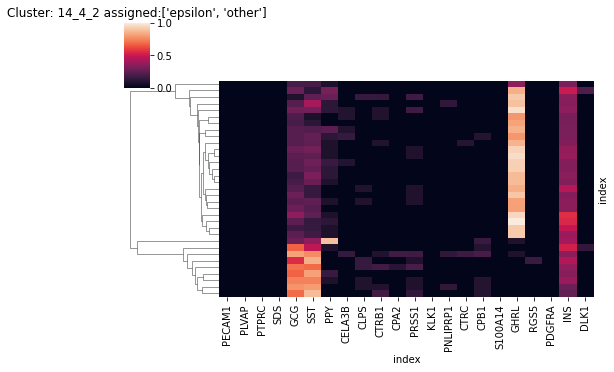

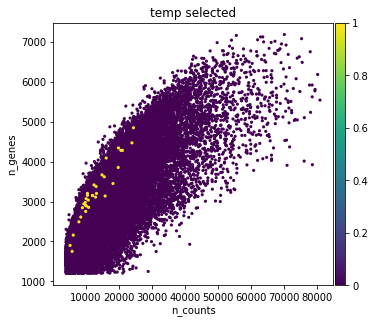


Cluster: 14_4_3 	size: 27
Present: ['alpha_delta', 'gamma']
alpha_delta                       0.370370
gamma                             0.296296
delta                             0.111111
delta_gamma                       0.037037
alpha_beta_delta                  0.037037
gamma_stellate_quiescent          0.037037
beta_delta                        0.037037
alpha_delta_stellate_activated    0.037037
NA                                0.037037
Name: type_union, dtype: float64


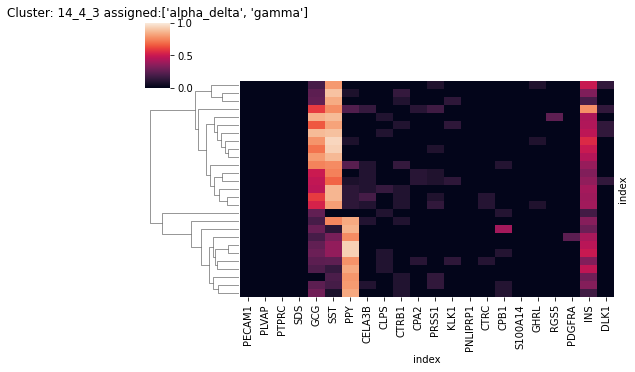

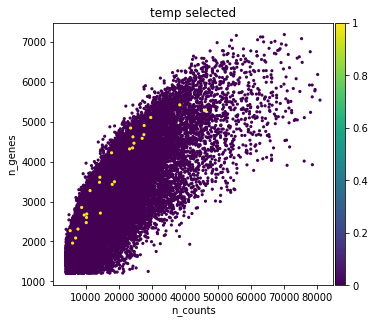


Cluster: 14_4_4 	size: 20
Present: ['gamma', 'alpha_delta']
gamma                       0.60
alpha_delta                 0.30
delta                       0.05
gamma_stellate_quiescent    0.05
Name: type_union, dtype: float64


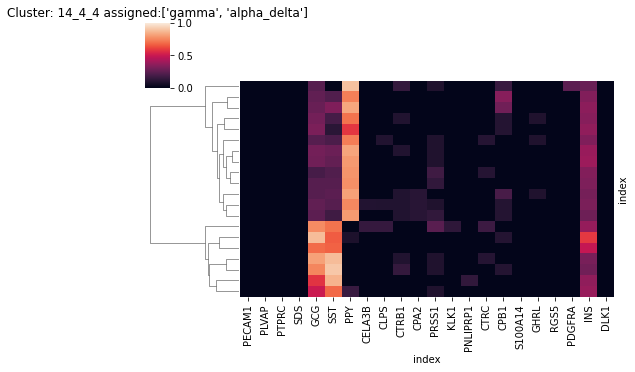

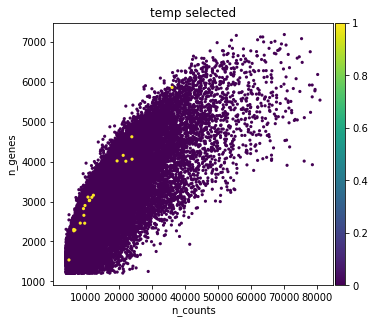


Cluster: 14_4_5 	size: 14
Present: ['alpha_delta', 'gamma']
alpha_delta          0.571429
gamma                0.214286
alpha                0.142857
endothelial_gamma    0.071429
Name: type_union, dtype: float64


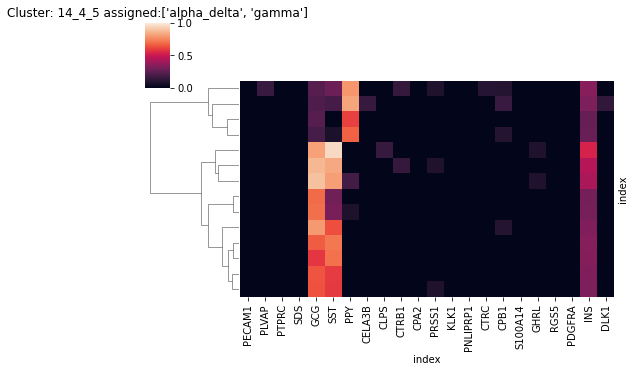

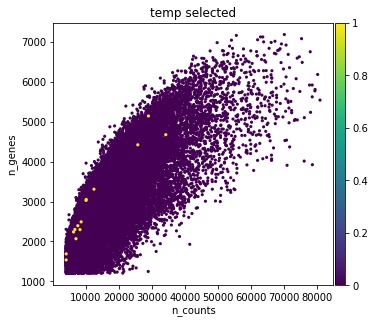


Cluster: 14_4_6 	size: 4
Present: ['alpha_delta', 'gamma', 'NA']
alpha_delta    0.50
gamma          0.25
NA             0.25
Name: type_union, dtype: float64


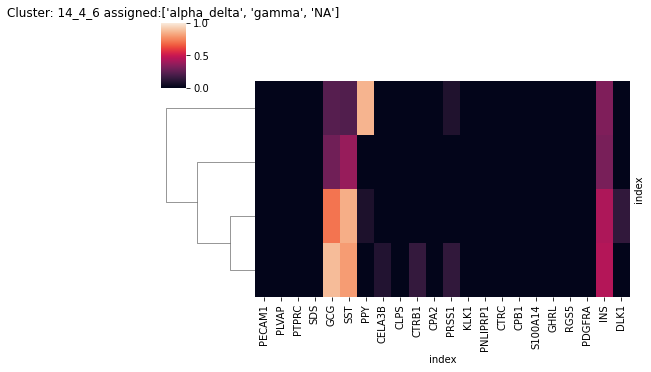

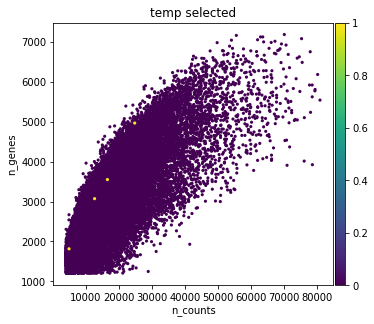

In [82]:
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] 
         #if cell_type !='NA' and cell_type !='other'
        ]) == 0:
        print('**** Original cluster',cluster)
        res=0.8
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.2,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

In [83]:
# Some gamma clusters are mixed but it does not seem they could be resolved
cluster_annotation['14_4_2'] = ['NA']
cluster_annotation['14_4_3'] = ['NA']
cluster_annotation['14_4_4'] = ['NA']
cluster_annotation['14_4_5'] = ['NA']
cluster_annotation['14_4_6'] = ['NA']


Manually assigning epsilon cells by GHRL score

In [84]:
genes=['GHRL']
score_name='ghrl'
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_12583/1638758935.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


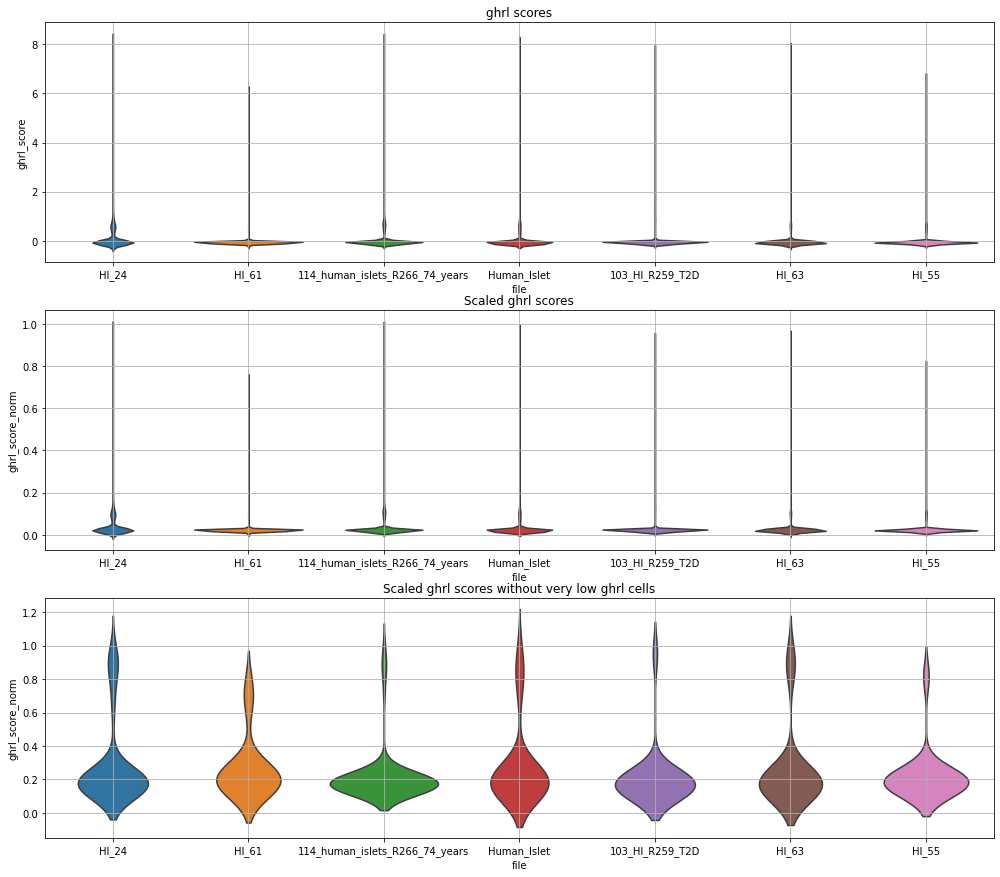

In [85]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(17,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.15],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [86]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'HI_24':0.5,'HI_61':0.5,'114_human_islets_R266_74_years':0.575,'Human_Islet':0.55,'103_HI_R259_T2D':0.575,'HI_63':0.55,'HI_55':0.575}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of ghrl high across samples:


file                            ghrl_high
HI_24                           False        0.996175
                                True         0.003825
HI_61                           False        0.999680
                                True         0.000320
114_human_islets_R266_74_years  False        0.999358
                                True         0.000642
Human_Islet                     False        0.999034
                                True         0.000966
103_HI_R259_T2D                 False        0.999833
                                True         0.000167
HI_63                           False        0.998879
                                True         0.001121
HI_55                           False        0.999776
                                True         0.000224
Name: ghrl_high, dtype: float64

In [87]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

The below would assign cells to cts based on marker scores. This will nto be used. Instead cells witll be given annotation NA.

#### Add cluster based annotation to adata

In [88]:
# Display cluster annotation of clusters that will be used
clusters=list(adata_rawnormalised.obs['cluster'].unique())
clusters.sort()
for cluster in clusters:
    print(cluster ,cluster_annotation[cluster ])

0 ['alpha']
1 ['beta']
10 ['ductal']
11 ['alpha']
12 ['delta']
13 ['stellate_quiescent']
14_0 ['delta']
14_1 ['delta']
14_2 ['delta']
14_3 ['delta']
14_4_0 ['gamma']
14_4_1 ['gamma']
14_4_2 ['NA']
14_4_3 ['NA']
14_4_4 ['NA']
14_4_5 ['NA']
14_4_6 ['NA']
15 ['beta']
16 ['ductal']
17 ['beta']
18_0 ['stellate_activated']
18_1 ['stellate_activated']
18_2 ['stellate_activated']
18_3 ['stellate_activated']
18_4 ['stellate_activated']
18_5 ['NA']
18_6 ['alpha_stellate_activated']
19 ['beta_delta']
2 ['alpha']
20 ['alpha']
21 ['acinar_ductal']
22 ['endothelial']
23 ['immune']
3 ['alpha']
4 ['alpha']
5 ['beta']
6 ['beta']
7 ['acinar']
8 ['beta']
9 ['alpha']


In [89]:
# Add cell type annotation to clusters. 
# If clusters was annotated with more than one cell type (inbcluding NA or other) set it to 'NA'.
if 'cell_type' in adata_rawnormalised.obs.columns:
    adata_rawnormalised.obs.drop('cell_type',axis=1,inplace=True)
for row_idx in adata_rawnormalised.obs.index:
    cluster=adata_rawnormalised.obs.at[row_idx,'cluster']
    cell_type=cluster_annotation[cluster]
    if len(cell_type)!=1:
        cell_type='NA'
    else:
        cell_type=cell_type[0]
        
    add_category(df=adata_rawnormalised.obs,idxs=row_idx,col='cell_type',category=cell_type)

In [113]:
adata_rawnormalised.obs['ghrl_high'] = adata_rawnorm.obs['ghrl_high']
adata_rawnormalised.obs.loc[adata_rawnormalised.obs['ghrl_high'] == True, 'cell_type'] = 'epsilon'

### Cell type annotation evaluation

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


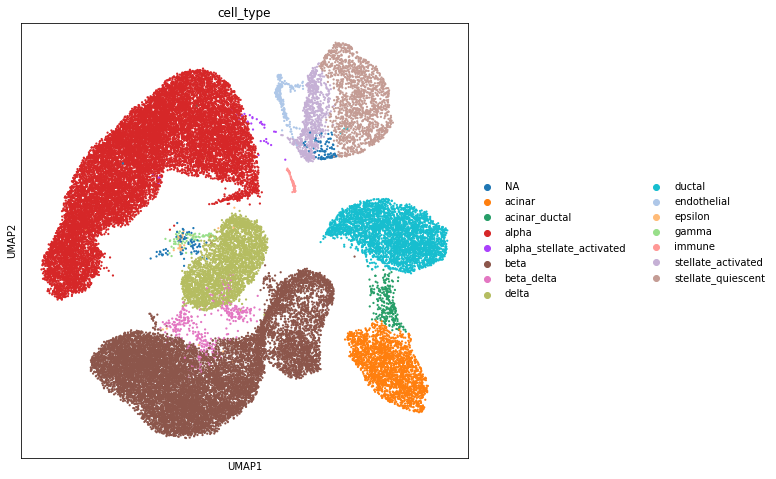

In [115]:
# Plot cell types on UMPA (pre-annotated and new ones)
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_rawnormalised, color=['cell_type'], size=20, use_raw=False,wspace=0.3)

In [116]:
# Count of new cell types
adata_rawnormalised.obs.cell_type.value_counts()

alpha                       16522
beta                        13312
ductal                       3498
delta                        3147
acinar                       2203
stellate_quiescent           1578
stellate_activated            814
beta_delta                    389
acinar_ductal                 259
endothelial                   223
NA                            174
gamma                          77
immune                         72
epsilon                        43
alpha_stellate_activated       35
Name: cell_type, dtype: int64

Text(0.5, 1.0, 'cell_type')

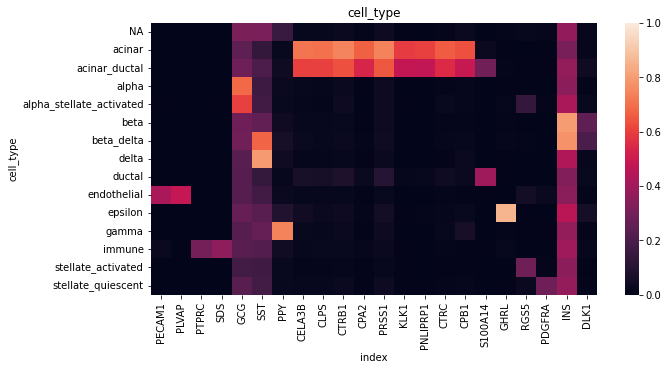

In [117]:
# Plot mean marker expression in each cluster
rcParams['figure.figsize']=(10,5)
#fig,ax=plt.subplots()
#sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['pre_cell_type']).mean(),yticklabels=1,xticklabels=1,
#          vmin=0,vmax=1)
#ax.set_title('pre_cell_type')
fig,ax=plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['cell_type']).mean(),yticklabels=1,xticklabels=1,
          vmin=0,vmax=1)
ax.set_title('cell_type')

Expression of markers in individual NA cells. Not used as we do not have any NA cells.

In [118]:
# Subset marker expression to NA cell type cells and plot heatmap
#sb.clustermap(pd.DataFrame(scaled_expression[adata_rawnormalised.obs.cell_type=='NA']), 
#                  row_cluster=True, col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5),vmin=0,vmax=1)

QC metrics in each cell type.

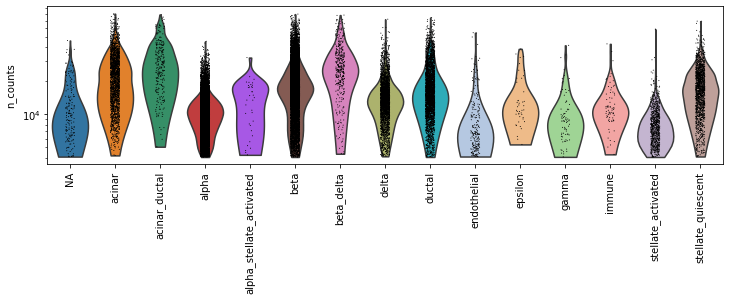

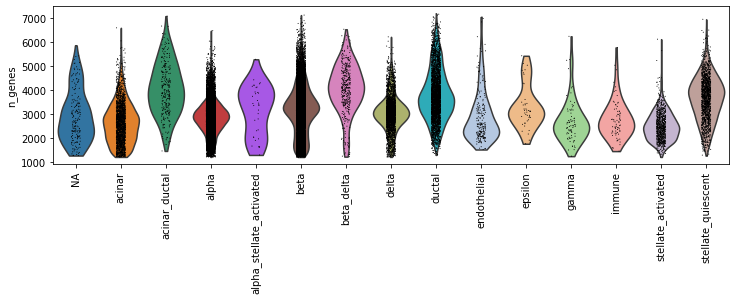

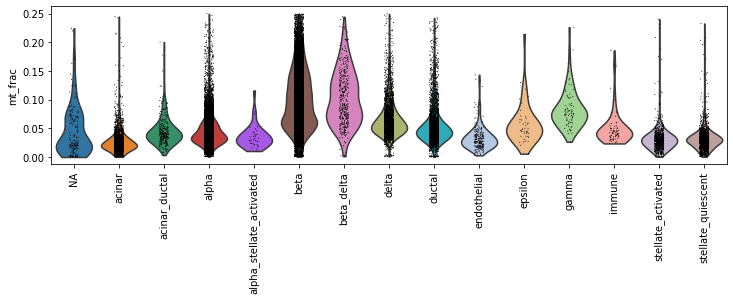

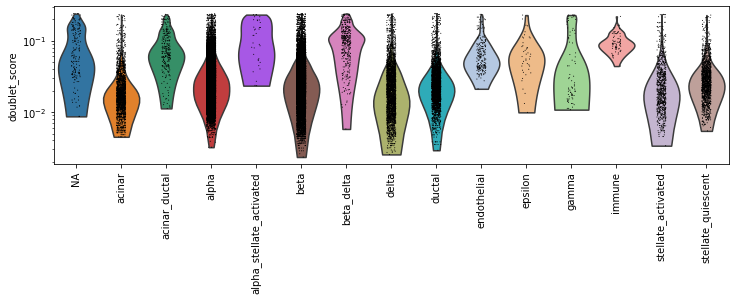

In [119]:
# QC metrics per cell type
rcParams['figure.figsize']=(10,3)
sc.pl.violin(adata_rawnormalised, ['n_counts'], groupby='cell_type', size=1, log=True,rotation=90)
sc.pl.violin(adata_rawnormalised, ['n_genes'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata_rawnormalised, ['mt_frac'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata_rawnormalised, 'doublet_score',groupby='cell_type',size=1, log=True,rotation=90)

Add cell type data to original adata for saving.

In [120]:
# Add cell type to adata
adata.obs['cell_type']=adata_rawnormalised.obs.cell_type
# Add final clusters and starting clusters to adata
adata.obs[['cluster',clusters_col]]=adata_rawnormalised.obs[['cluster',clusters_col]]
# Add cell type scores
# using scores_df instead of scores_df_norm because it was commented out above
score_cols=[col for col in scores_df.columns if '_score' in col]
adata.obs[score_cols]=scores_df[score_cols].reindex(adata.obs.index)

#### Cell type markers

Upregulated genes in each cell type compared to other cells on normalised log scaled data.

Expression of upregulated genes on normalised log transformed z-scaled data

### Expected doublet rates

Adapted from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6126471/#ref-7, but using 0.1 as doublet rate (described in my notes).

Expected multiplet number is calculated for each file separately.

Most above observed multiple cell type cells are likely dublets. The only ones where this is not clear are beta_delta and acinar_ductal.

In [121]:
# Singlet cell types whose multiplet rates are predicted
cell_types=['ductal','acinar']
# DFs with expected multiplet rates
expected_dfs=[]
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:',file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types=[]
    cell_type_temp=adata.obs.query('file == "'+file+'" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns=dict()
    for cell_type in cell_types:
        n_celltype=cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type]=n_celltype
    print('N droplets that contain at least one:',Ns)
    
    # Calculate N (see formula in notes)
    N=emr.get_N(Ns=Ns.values())
    regex_any='|'.join(['.*'+cell_type+'.*' for cell_type in cell_types])
    print('N:',round(N,1), '(observed cell-containing N with relevant cell types:',
          cell_type_temp.str.contains(fr'{regex_any}').sum(),')')
    
    # Calculate mu for each cell type
    mus=dict()
    for cell_type in cell_types:
        mus[cell_type]=emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:',{k:round(v,4) for k,v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types=dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all=cell_type.split('_')
        components_relevant=[type_singlet for type_singlet in components_all if type_singlet in cell_types]
        # retain only cts containing only relevant components
        all_relevant=all([component in cell_types for component in components_all])
        if len(components_relevant) > 1 and all_relevant:
            multiplet_types[cell_type]=components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df=pd.DataFrame(index=multiplet_types.keys(),columns=['O_'+file,'E_'+file
                                                                  # ,'E_atleast'
                                                                  ])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent=np.setdiff1d(cell_types,components)
        # N of cellls of this cell type
        expected_df.at[multiplet,'O_'+file]=(cell_type_temp==multiplet).sum()
        # Expected N of cells that have all the individual cell types of multiplet and non of the other 
        # considered possible multiplet ontributors
        expected_df.at[multiplet,'E_'+file]=emr.expected_multiplet(
            mu_present=[mus[cell_type] for cell_type in components], 
            mu_absent=[mus[cell_type] for cell_type in absent], 
            N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs,axis=1))
del cell_type_temp


File: HI_24
N droplets that contain at least one: {'ductal': 465, 'acinar': 377}
N: 1806.1 (observed cell-containing N with relevant cell types: 787 )
mu: {'ductal': 0.2977, 'acinar': 0.2341}

File: HI_61
N droplets that contain at least one: {'ductal': 145, 'acinar': 71}
N: 470.7 (observed cell-containing N with relevant cell types: 199 )
mu: {'ductal': 0.3683, 'acinar': 0.1635}

File: 114_human_islets_R266_74_years
N droplets that contain at least one: {'ductal': 544, 'acinar': 75}
N: 1431.7 (observed cell-containing N with relevant cell types: 606 )
mu: {'ductal': 0.478, 'acinar': 0.0538}

File: Human_Islet
N droplets that contain at least one: {'ductal': 287, 'acinar': 188}
N: 1023.9 (observed cell-containing N with relevant cell types: 435 )
mu: {'ductal': 0.3289, 'acinar': 0.2029}

File: 103_HI_R259_T2D
N droplets that contain at least one: {'ductal': 651, 'acinar': 761}
N: 3026.5 (observed cell-containing N with relevant cell types: 1357 )
mu: {'ductal': 0.2422, 'acinar': 0.289

,O_HI_24,E_HI_24,O_HI_61,E_HI_61,O_114_human_islets_R266_74_years,E_114_human_islets_R266_74_years,O_Human_Islet,E_Human_Islet,O_103_HI_R259_T2D,E_103_HI_R259_T2D,O_HI_63,E_HI_63,O_HI_55,E_HI_55
acinar_ductal,55,97.063846,17,21.873812,13,28.498459,40,52.698654,55,163.691428,7,23.324782,72,257.773285


In [122]:
# Singlet cell types whose multiplet rates are predicted
cell_types=['beta','delta']
# DFs with expected multiplet rates
expected_dfs=[]
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:',file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types=[]
    cell_type_temp=adata.obs.query('file == "'+file+'" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns=dict()
    for cell_type in cell_types:
        n_celltype=cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type]=n_celltype
    print('N droplets that contain at least one:',Ns)
    
    # Calculate N (see formula in notes)
    N=emr.get_N(Ns=Ns.values())
    regex_any='|'.join(['.*'+cell_type+'.*' for cell_type in cell_types])
    print('N:',round(N,1), '(observed cell-containing N with relevant cell types:',
          cell_type_temp.str.contains(fr'{regex_any}').sum(),')')
    
    # Calculate mu for each cell type
    mus=dict()
    for cell_type in cell_types:
        mus[cell_type]=emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:',{k:round(v,4) for k,v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types=dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all=cell_type.split('_')
        components_relevant=[type_singlet for type_singlet in components_all if type_singlet in cell_types]
        # retain only cts containing only relevant components
        all_relevant=all([component in cell_types for component in components_all])
        if len(components_relevant) > 1 and all_relevant:
            multiplet_types[cell_type]=components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df=pd.DataFrame(index=multiplet_types.keys(),columns=['O_'+file,'E_'+file
                                                                  # ,'E_atleast'
                                                                  ])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent=np.setdiff1d(cell_types,components)
        # N of cellls of this cell type
        expected_df.at[multiplet,'O_'+file]=(cell_type_temp==multiplet).sum()
        # Expected N of cells that have all the individual cell types of multiplet and non of the other 
        # considered possible multiplet ontributors
        expected_df.at[multiplet,'E_'+file]=emr.expected_multiplet(
            mu_present=[mus[cell_type] for cell_type in components], 
            mu_absent=[mus[cell_type] for cell_type in absent], 
            N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs,axis=1))
del cell_type_temp


File: HI_24
N droplets that contain at least one: {'beta': 1632, 'delta': 561}
N: 4860.2 (observed cell-containing N with relevant cell types: 2116 )
mu: {'beta': 0.4092, 'delta': 0.1227}

File: HI_61
N droplets that contain at least one: {'beta': 2327, 'delta': 1546}
N: 8344.8 (observed cell-containing N with relevant cell types: 3748 )
mu: {'beta': 0.3269, 'delta': 0.2049}

File: 114_human_islets_R266_74_years
N droplets that contain at least one: {'beta': 3725, 'delta': 416}
N: 9650.4 (observed cell-containing N with relevant cell types: 4104 )
mu: {'beta': 0.4877, 'delta': 0.0441}

File: Human_Islet
N droplets that contain at least one: {'beta': 2420, 'delta': 563}
N: 6742.3 (observed cell-containing N with relevant cell types: 2886 )
mu: {'beta': 0.4446, 'delta': 0.0872}

File: 103_HI_R259_T2D
N droplets that contain at least one: {'beta': 512, 'delta': 71}
N: 1348.1 (observed cell-containing N with relevant cell types: 575 )
mu: {'beta': 0.4777, 'delta': 0.0541}

File: HI_63
N d

,O_HI_24,E_HI_24,O_HI_61,E_HI_61,O_114_human_islets_R266_74_years,E_114_human_islets_R266_74_years,O_Human_Islet,E_Human_Islet,O_103_HI_R259_T2D,E_103_HI_R259_T2D,O_HI_63,E_HI_63,O_HI_55,E_HI_55
beta_delta,77,188.379238,125,431.113443,37,160.572872,97,202.077078,8,26.965522,32,94.201368,13,49.356998


C: Both acinar_ductal and beta_delta are likely multiplets.

In [123]:
adata.obs.cell_type.unique().to_list()

['beta',
 'alpha',
 'delta',
 'stellate_activated',
 'acinar_ductal',
 'acinar',
 'stellate_quiescent',
 'NA',
 'ductal',
 'immune',
 'beta_delta',
 'epsilon',
 'gamma',
 'endothelial',
 'alpha_stellate_activated']

In [124]:
# Reassign cell types to multiplet
multiplets=['acinar_ductal', 'beta_delta', 'alpha_stellate_actviated']
adata.obs['cell_type_multiplet']=adata.obs.cell_type.replace(multiplets, 'multiplet')

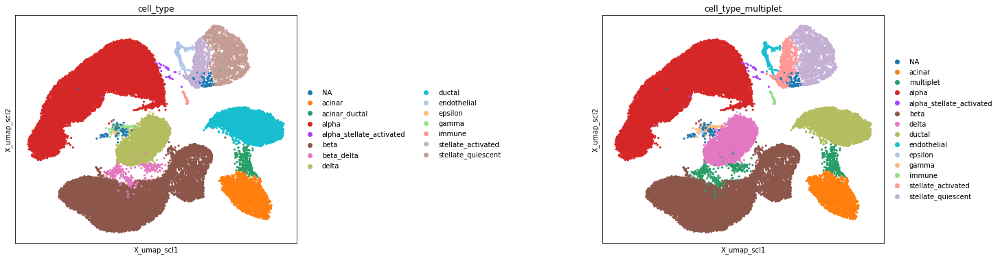

In [125]:
adata.obsm['X_umap_scl']=adata_scl.obsm['X_umap']

# Plot new cell types
rcParams['figure.figsize']=(6,6)
sc.pl.embedding(adata,'X_umap_scl', color=['cell_type','cell_type_multiplet'],
                size=40, use_raw=False,wspace=0.9)

Below: Beta subtypes are not further resolved.

Proportion of cells of each cell type in each batch

<AxesSubplot:>

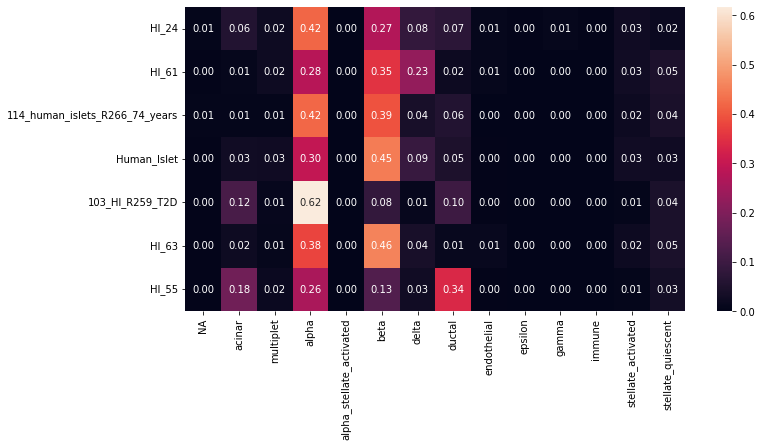

In [126]:
# ratio of each ct in each study
ct_study_ratios=pd.DataFrame()
for (study,hc),ratio in adata.obs.\
        groupby('file',observed=True)['cell_type_multiplet'].\
        value_counts(normalize=True,sort=False).iteritems():
    ct_study_ratios.at[study,hc]=ratio
ct_study_ratios.fillna(0,inplace=True)
fig,ax=plt.subplots(figsize=(ct_study_ratios.shape[1]*0.8,ct_study_ratios.shape[0]*0.8))
sb.heatmap(ct_study_ratios,ax=ax,annot=True,fmt='.2f')

<AxesSubplot:>

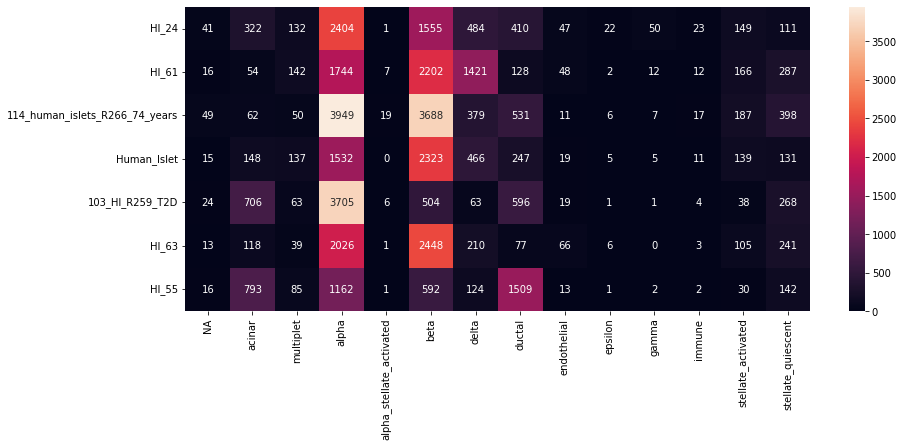

In [127]:
# Number of each ct in each study
ct_study_ratios=pd.DataFrame()
for (study,hc),ratio in adata.obs.\
        groupby('file',observed=True)['cell_type_multiplet'].\
        value_counts(normalize=False,sort=False).iteritems():
    ct_study_ratios.at[study,hc]=ratio
ct_study_ratios.fillna(0,inplace=True)
fig,ax=plt.subplots(figsize=(ct_study_ratios.shape[1]*1,ct_study_ratios.shape[0]*0.8))
sb.heatmap(ct_study_ratios,ax=ax,annot=True,fmt='.0f')

### Save annotation

In [128]:
#h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)
adata.obs.doublet = adata.obs.doublet.astype(int)
adata.write(shared_folder+"data_annotated.h5ad")

In [129]:
shared_folder+"data_annotated.h5ad"

'/dss/dsshome1/lxc07/gobi009/data/P21000/data_annotated.h5ad'

In [101]:
#adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)